# CA ONE

## Part 1: MAP

### Use numpy to do math, use matplotlib to draw picture

In [3]:
import numpy as np
import matplotlib.pyplot as plt

### Use $ \sqrt{2\pi} = 2.5$ as the domain

In [4]:
def func(x):
    return np.sin(x**2 + 1)

x = np.linspace(0, 2.5, 50)
y = func(x)
u = np.linspace(0, 1, 50)
v = func(u)

### Draw the original curve

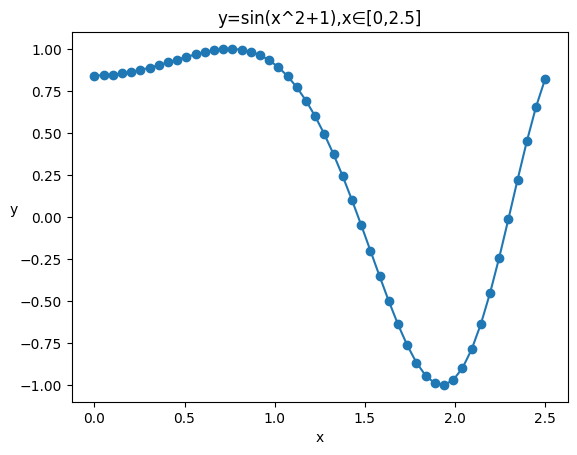

In [5]:
plt.scatter(x, y)
plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.title('y=sin(x^2+1),x∈[0,2.5]')
plt.show()

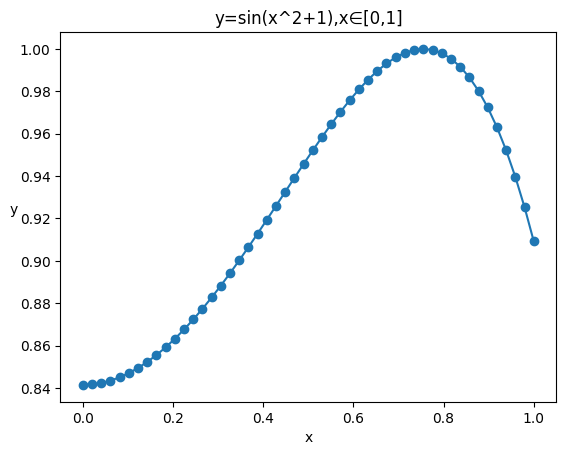

In [6]:
plt.scatter(u, v)
plt.plot(u, v)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.title('y=sin(x^2+1),x∈[0,1]')
plt.show()

### Add noise to y

In [7]:
noise = np.random.normal(0, 0.1, len(x))  # mean=0，standard deviation=0.1
y_noised = y + noise
v_noised = v + noise

### Draw the points with noise

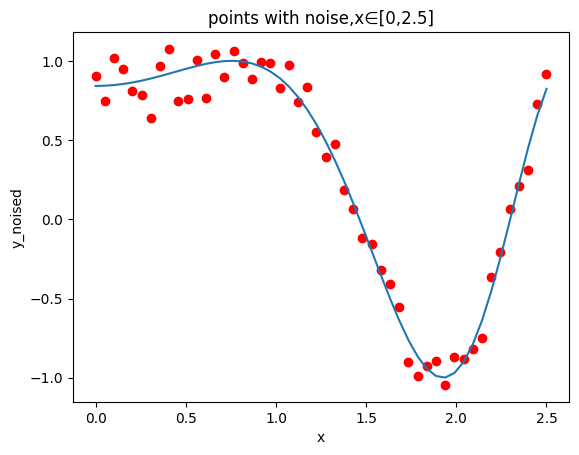

In [8]:
plt.scatter(x, y_noised,color='red')
plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('y_noised')
plt.title('points with noise,x∈[0,2.5]')
plt.show()

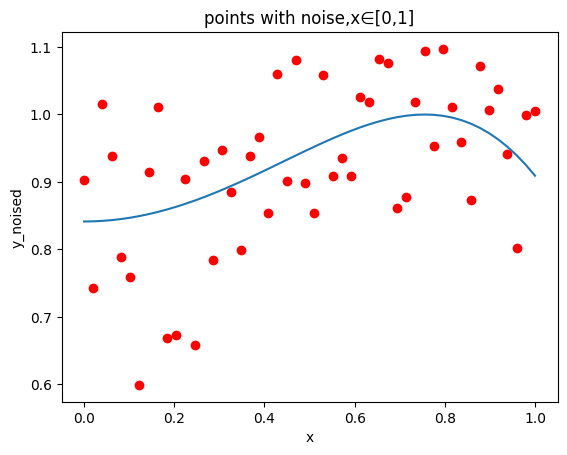

In [9]:
plt.scatter(u, v_noised,color='red')
plt.plot(u, v)
plt.xlabel('x')
plt.ylabel('y_noised')
plt.title('points with noise,x∈[0,1]')
plt.show()

### Calculate w
we have $ x_n=[x_n^0  x_n^1 ... x_n^M]^T $

$ X = [x_1  x_2 ... x_N]^T $

$ w = (X^T X + \frac{α}{β} I)^{-1} X^T t $

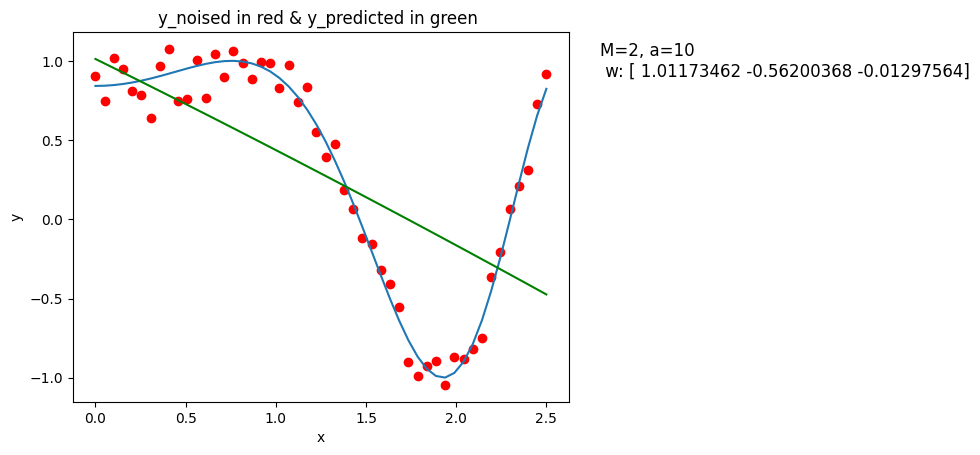

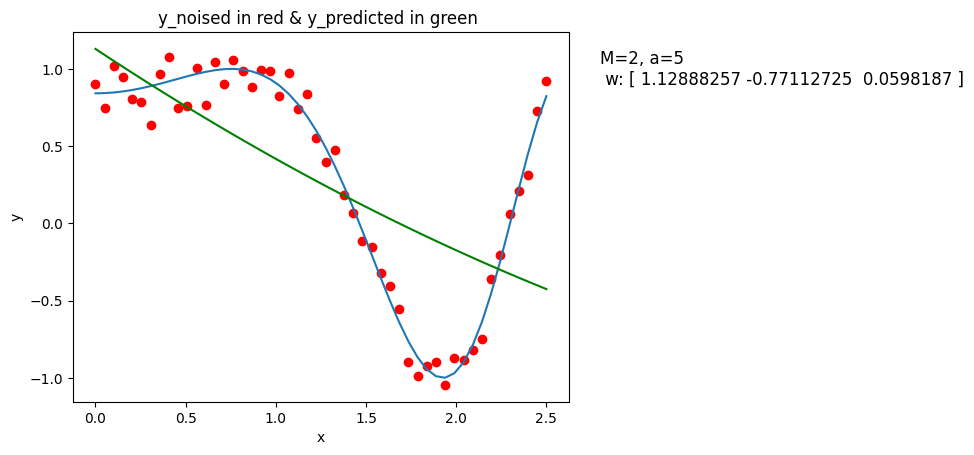

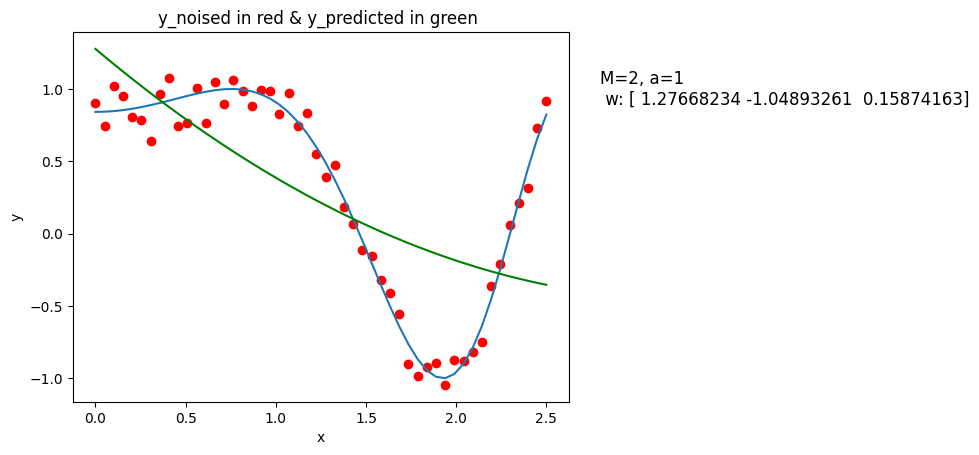

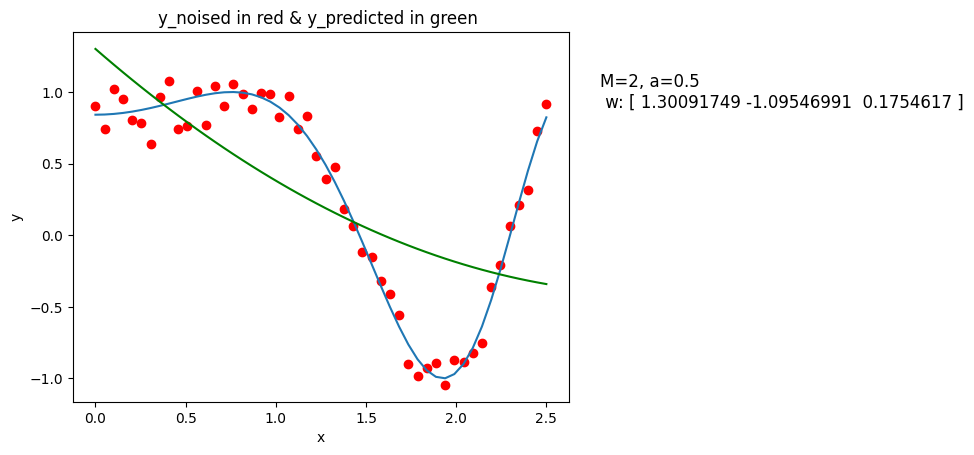

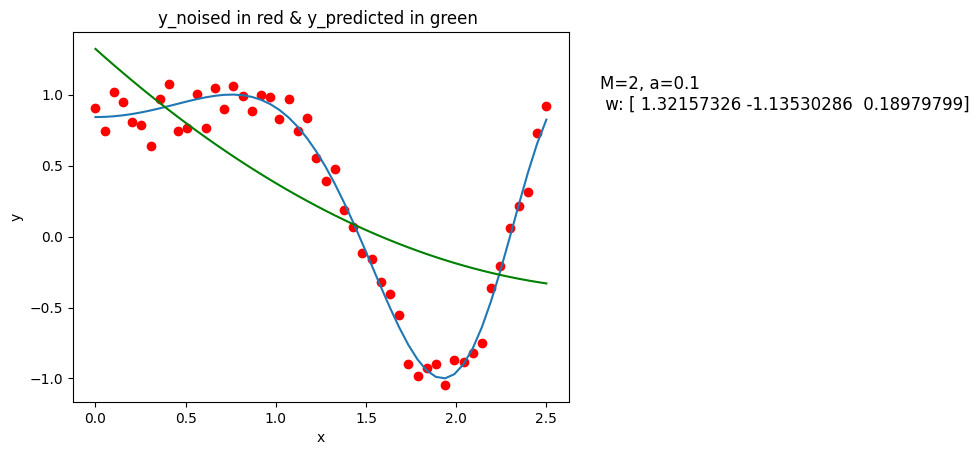

...

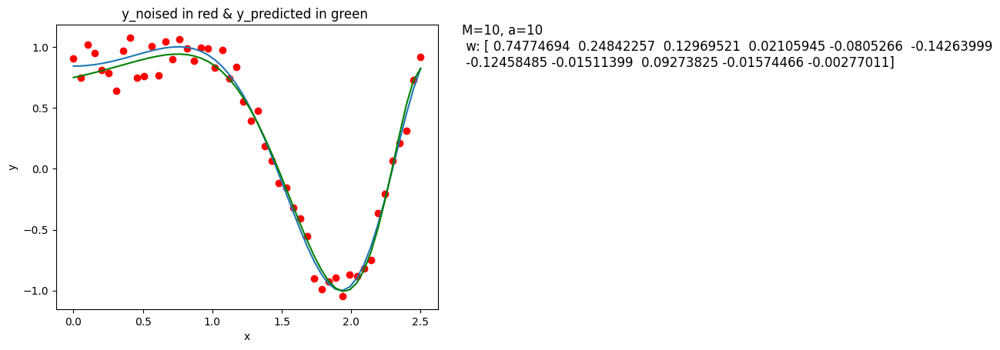

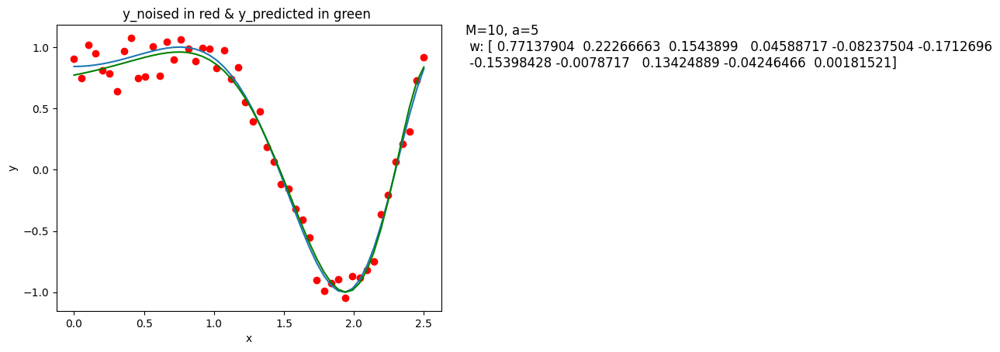

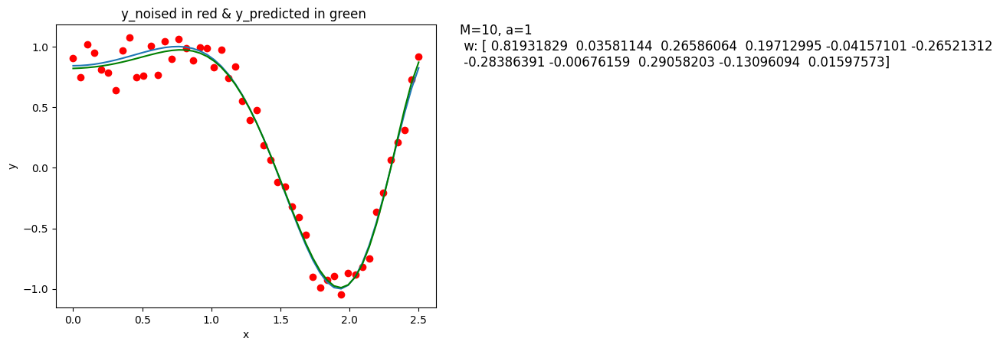

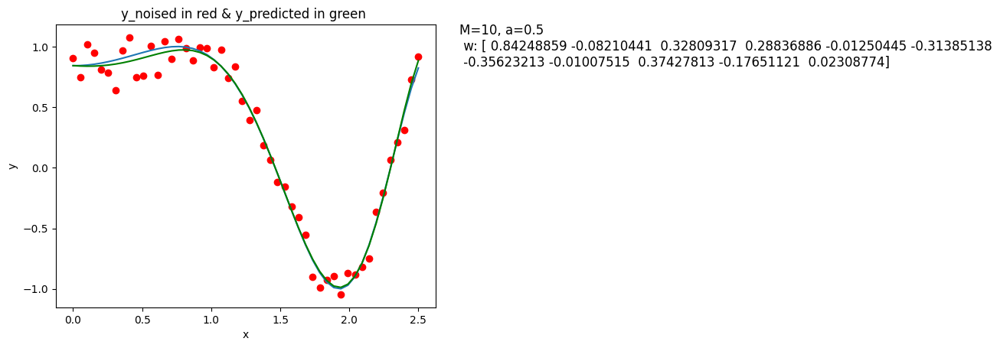

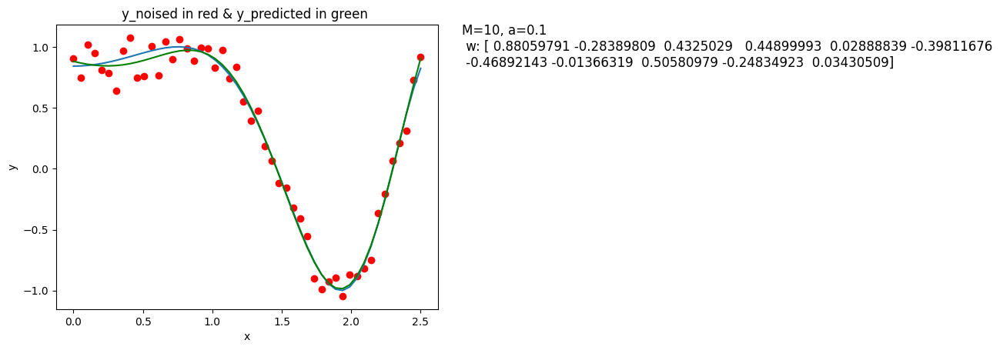

In [16]:
def generateXn(x, M):
    return np.array([x**i for i in range(M + 1)]).T          # (M+1) * 1

def calculate_w(x, M, b, a, t):
    X = generateXn(x, M)         # ()
    return np.linalg.pinv(X.T @ X + a/b * np.identity(M + 1)) @ X.T @ t

M = [2, 3, 5, 10]
b = 10
a = [10, 5, 1, 0.5, 0.1]

for Mi in M:
    for aj in a:
        w = calculate_w(x, Mi, b, aj, y_noised)
        y_predicted =  generateXn(x, Mi) @ w
        plt.scatter(x, y_noised,color='red')
        plt.plot(x, y)
        plt.plot(x, y_predicted, color='green')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.title('y_noised in red & y_predicted in green ')
        param_info = f'M={Mi}, a={aj}\n w: {w}'
        plt.text(max(x) + 0.3, max(y), param_info, fontsize=12, verticalalignment='center')
        plt.show()

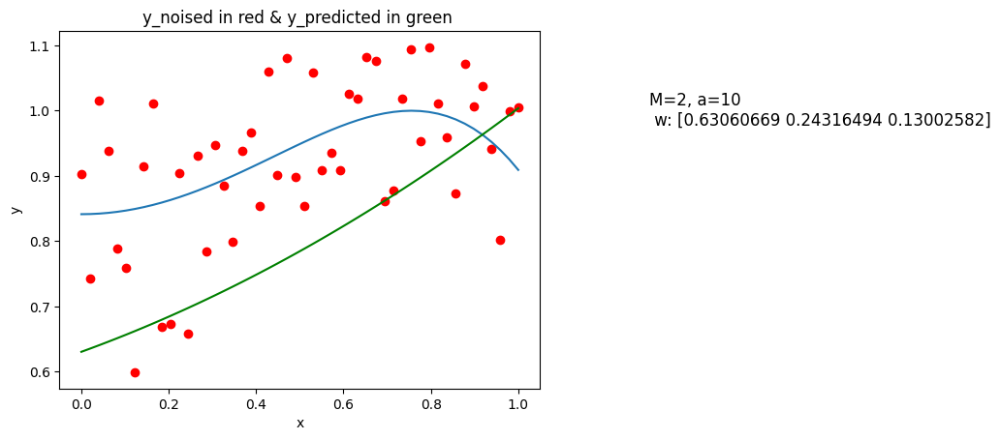

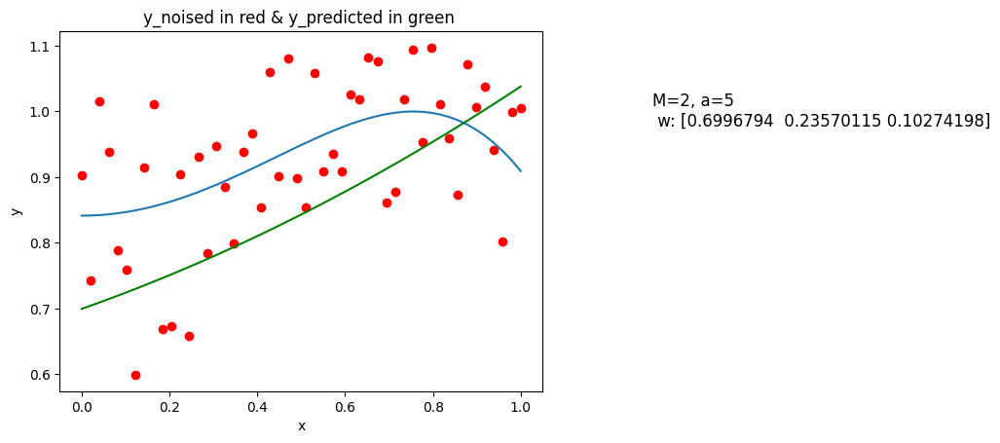

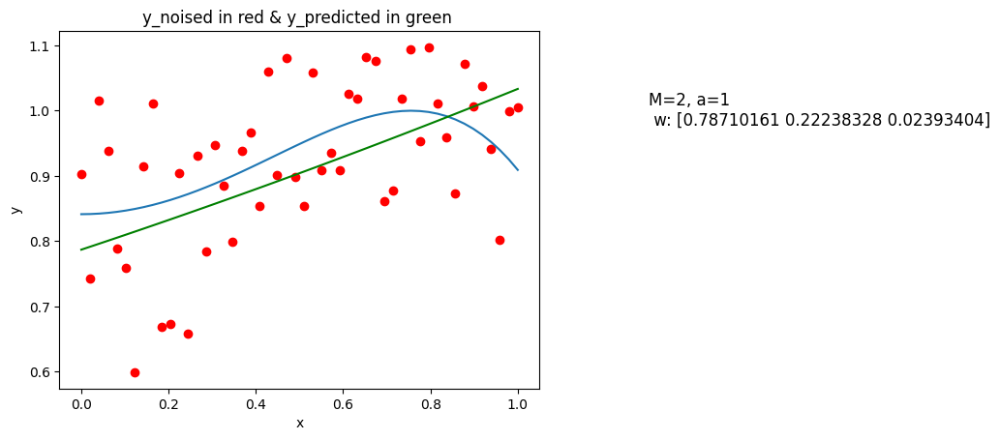

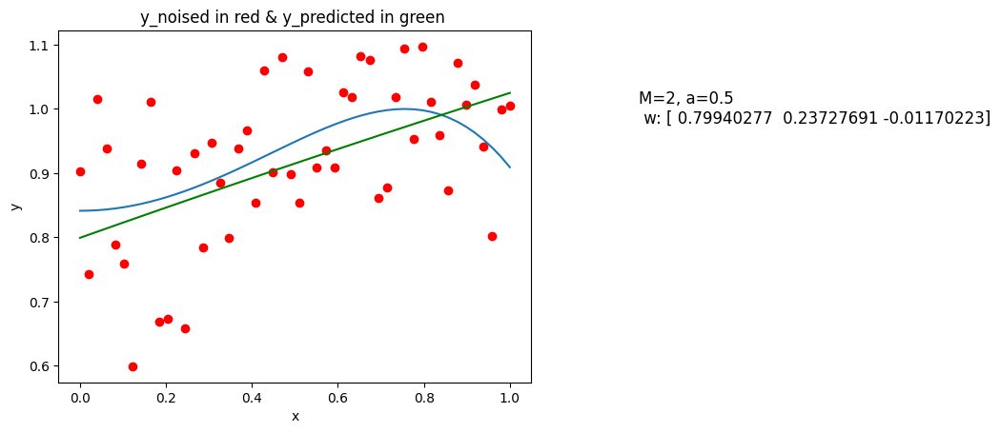

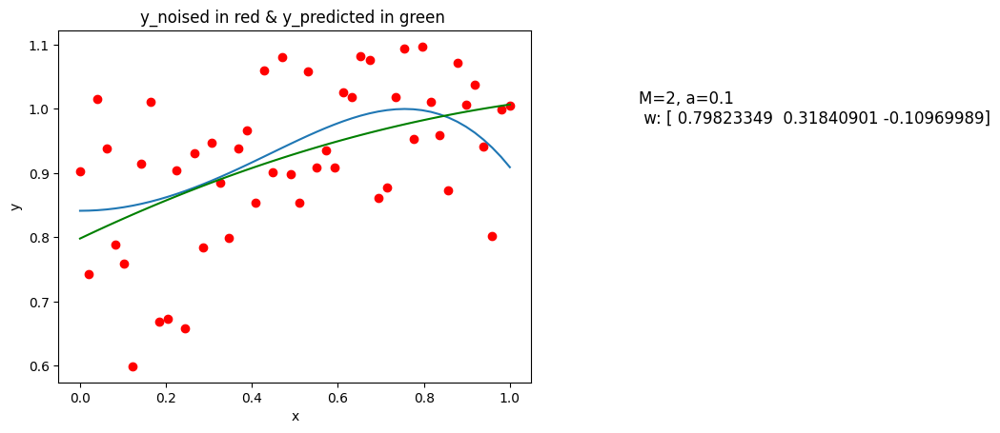

...

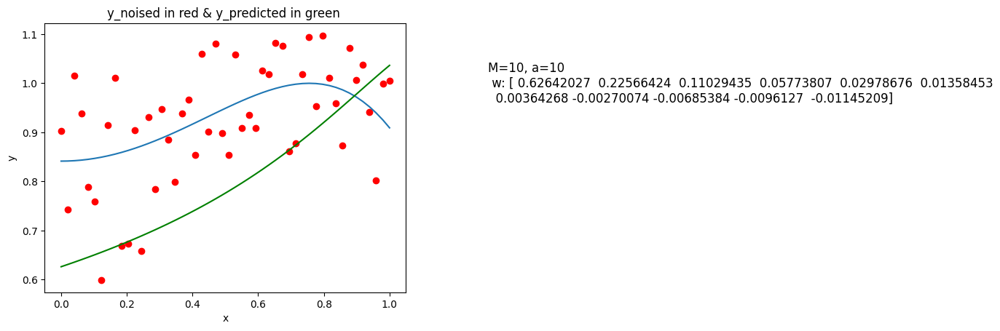

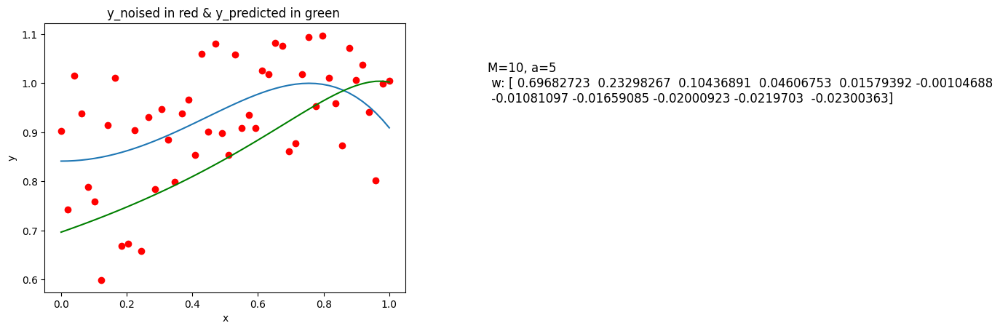

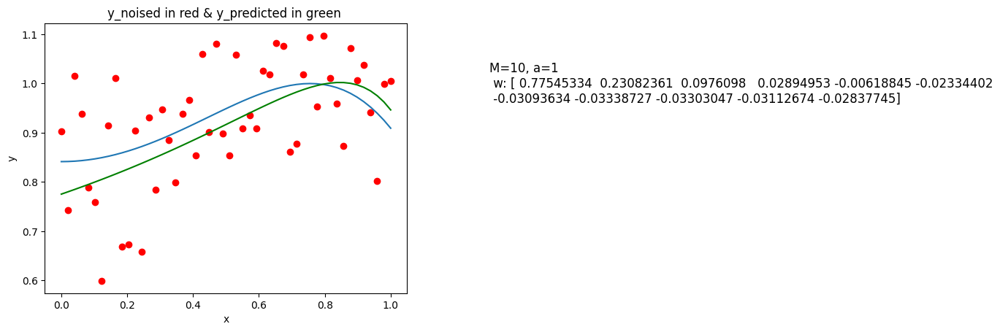

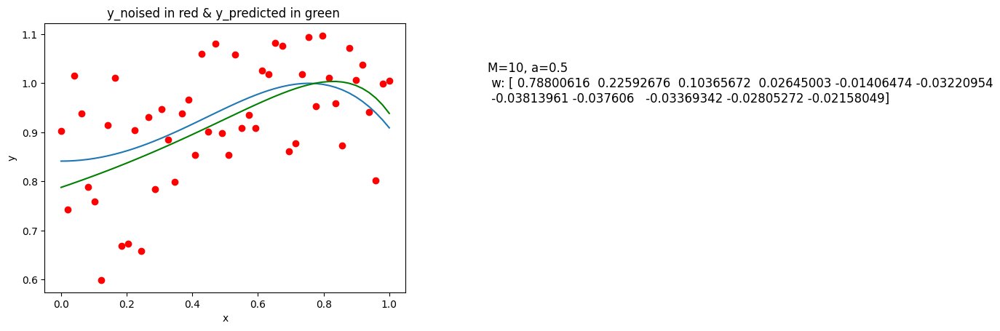

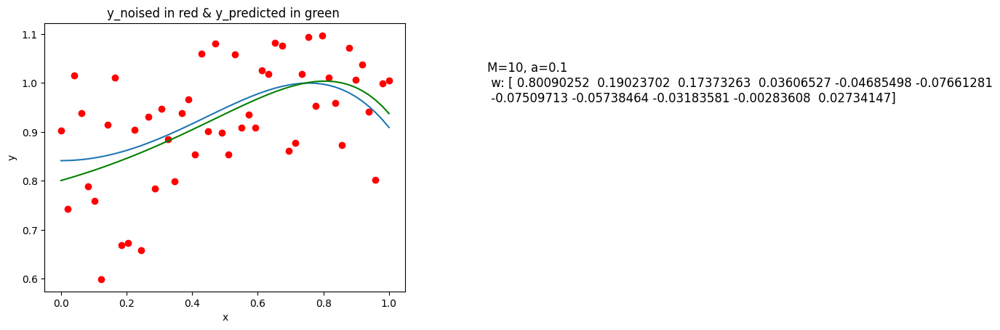

In [11]:
def generateAn(u, M):
    return np.array([u**i for i in range(M + 1)]).T          # (M+1) * 1

def calculate_w(u, M, b, a, t):
    X = generateXn(u, M)         # ()
    return np.linalg.pinv(X.T @ X + a/b * np.identity(M + 1)) @ X.T @ t

M = [2, 3, 5, 10]
b = 1
a = [10, 5, 1, 0.5, 0.1]

for Mi in M:
    for aj in a:
        w = calculate_w(u, Mi, b, aj, v_noised)
        v_predicted =  generateXn(u, Mi) @ w
        plt.scatter(u, v_noised,color='red')
        plt.plot(u, v)
        plt.plot(u, v_predicted, color='green')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.title('y_noised in red & y_predicted in green ')
        param_info = f'M={Mi}, a={aj}\n w: {w}'
        plt.text(max(u) + 0.3, max(v), param_info, fontsize=12, verticalalignment='center')
        plt.show()

<mark>The twenty pictures above show the fitting graphics for different values of M and α.<mark>

## Overfitting
<mark>To observe the overfitting phenomenon, we need to choose a small α. <mark>

<mark>I chose M = 10, α = 0.00001  <mark>

<mark>Under this situation, the probability of obtaining overfitting results is higher.<mark>

<mark>The over-fitting phenomenon will change with noise, and typical over-fitting figure do not occur every time.<mark>

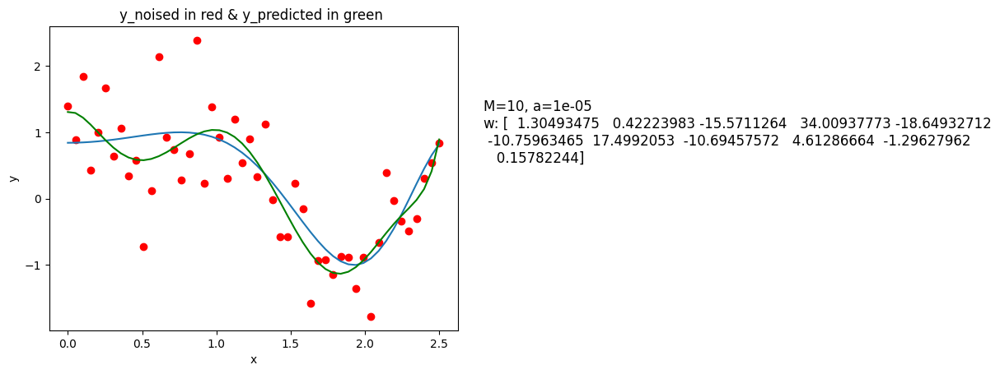

In [10]:
x = np.linspace(0, 2.5, 50)
y = func(x)

noise = np.random.normal(0, 0.6, len(x))  # mean=0，standard deviation=0.6
y_noised = y + noise
w = calculate_w(x, 10, b, 0.00001, y_noised)
y_predicted =  generateXn(x, 10) @ w
plt.scatter(x, y_noised,color='red')
plt.plot(x, y)
plt.plot(x, y_predicted, color='green')
plt.xlabel('x')
plt.ylabel('y')
plt.title('y_noised in red & y_predicted in green ')
param_info = f'M={10}, a={0.00001}\nw: {w}'
plt.text(max(x) + 0.3, max(y), param_info, fontsize=12, verticalalignment='center')
plt.show()

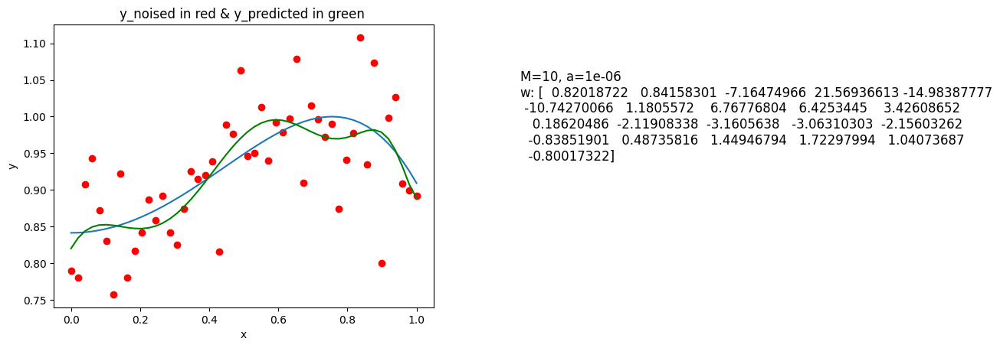

In [11]:
x = np.linspace(0, 1, 50)
y = func(x)

noise = np.random.normal(0, 0.05, len(x))  # mean=0，standard deviation=0.05
v_noised = v + noise
w = calculate_w(u, 20, b, 0.000001, v_noised)
v_predicted =  generateXn(u, 20) @ w
plt.scatter(u, v_noised,color='red')
plt.plot(u, v)
plt.plot(u, v_predicted, color='green')
plt.xlabel('x')
plt.ylabel('y')
plt.title('y_noised in red & y_predicted in green ')
param_info = f'M={10}, a={0.000001}\nw: {w}'
plt.text(max(u) + 0.3, max(v), param_info, fontsize=12, verticalalignment='center')
plt.show()

## From the experiment, discuss how M and alpha influence on the fitting accuracy.
<mark>Firstly, talking about alpha, it is more obvious when M = 2. I found that the smaller the alpha value was, the more curved the curve was. I think it is because when alpha is large, prior knowledge tells us that the noise is large. So the predicted curve will ignore more fluctuation.
Then the M, theoretically, the M value determines the number of bends of the polynomial curve. Because of the existance of noise, when M is large, it may record the waveform of the noise. The final result is doing well in training but bad in predicting.<mark>

## Part 2: MLE

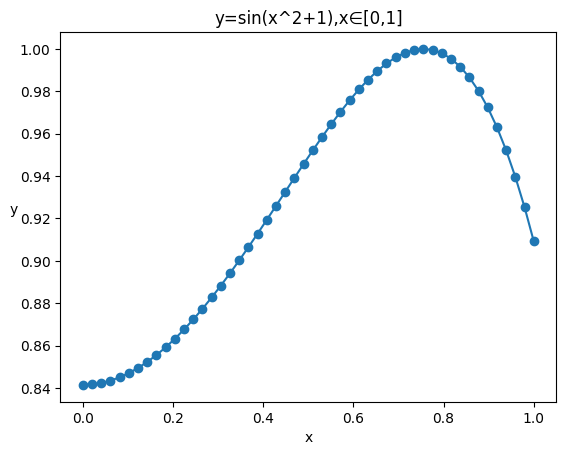

In [12]:
x = np.linspace(0, 1, 50)
y = func(x)

plt.scatter(x, y)
plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.title('y=sin(x^2+1),x∈[0,1]')
plt.show()

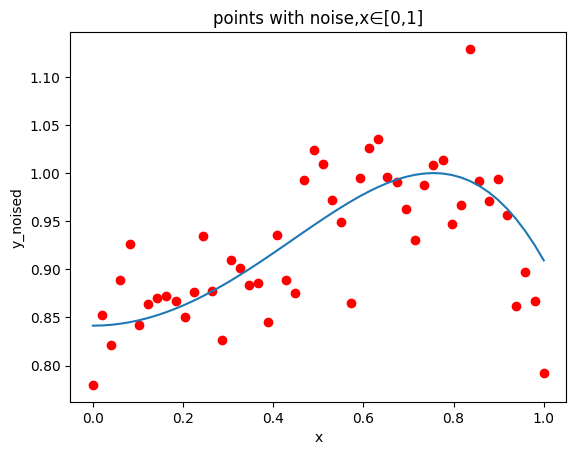

In [13]:
noise = np.random.normal(0, 0.05, len(x))  # mean=0，standard deviation=0.05
y_noised = y + noise
plt.scatter(x, y_noised,color='red')
plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('y_noised')
plt.title('points with noise,x∈[0,1]')
plt.show()

### Employs the Gaussian Basis Functions

$\phi_m (x_n) = exp(-\frac{(x_n-μ_m)^2}{2S^2})$,

$y(x_n,\bar\omega=\sum_{m=0}^{M-1}\omega_m\phi_m(x_n)) $

$ \Phi_{nj} = \phi_j(x_n) $

$ \omega_{ML}=(\Phi^T\Phi)^{-1}\Phi^Tt $

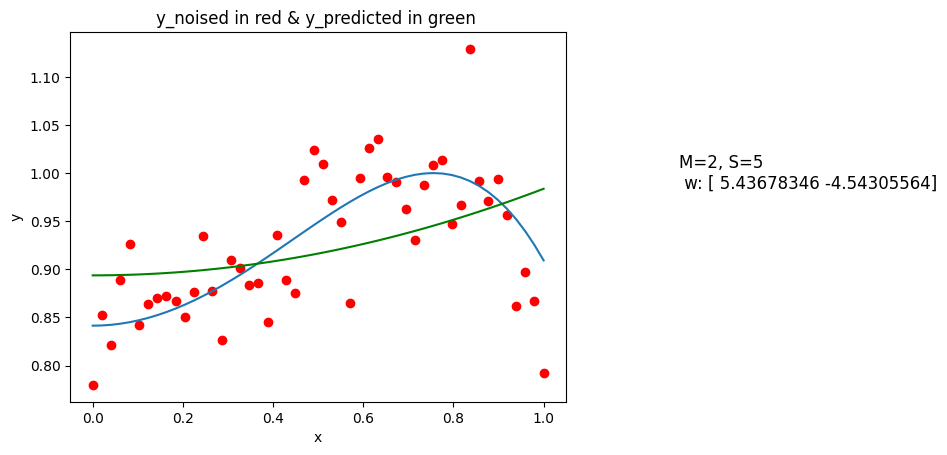

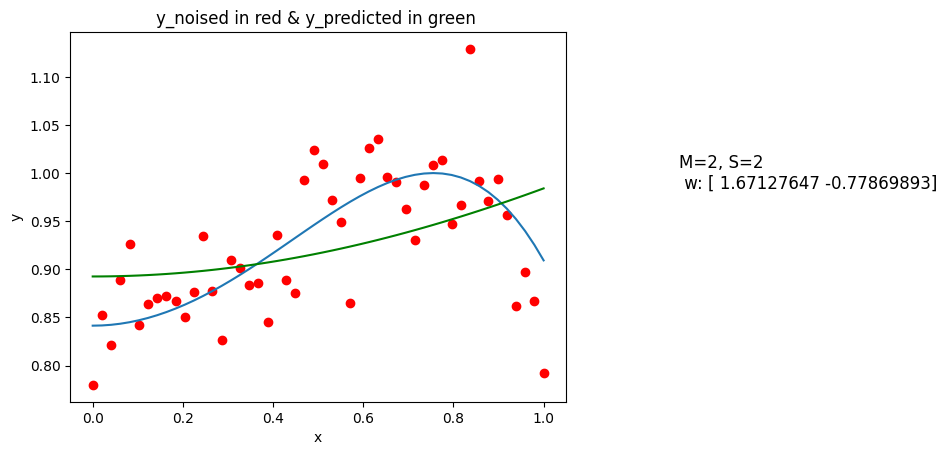

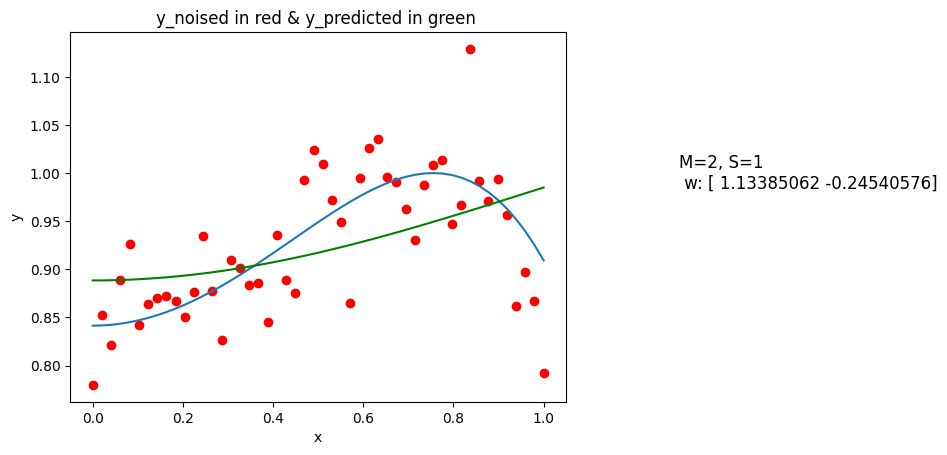

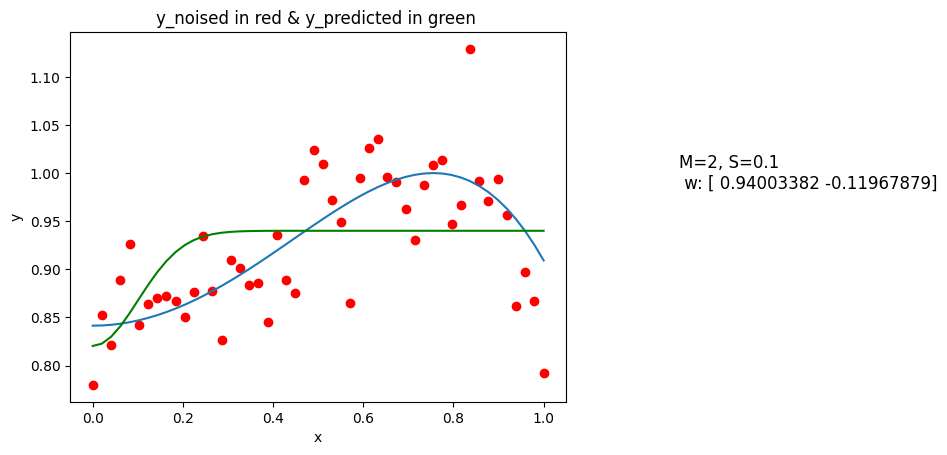

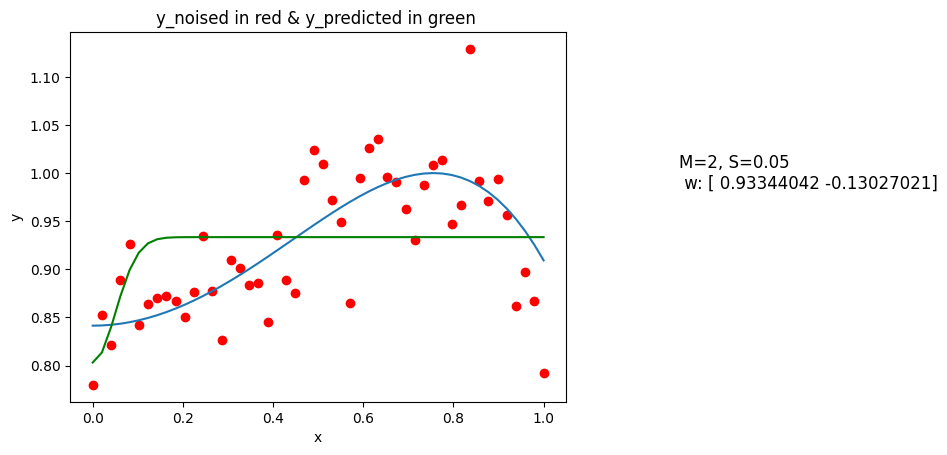

...

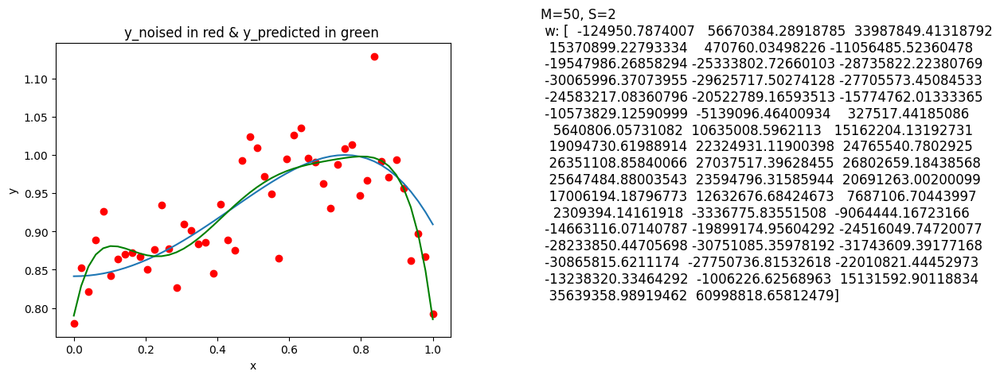

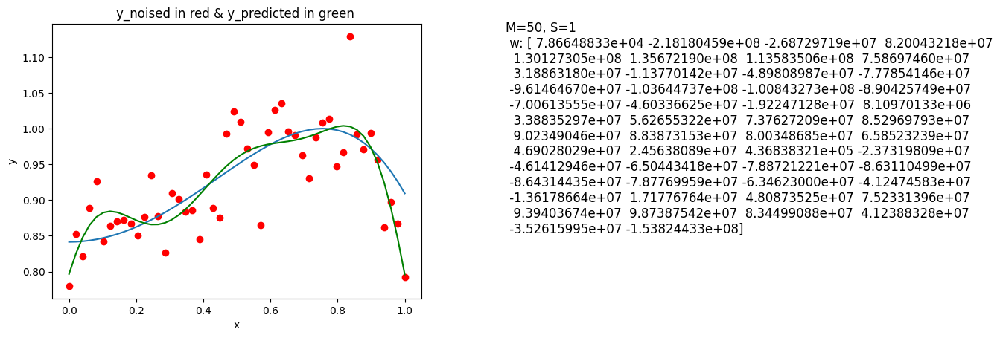

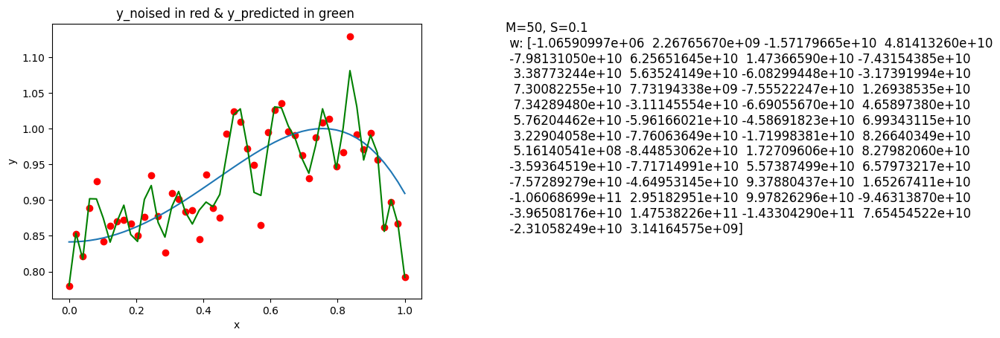

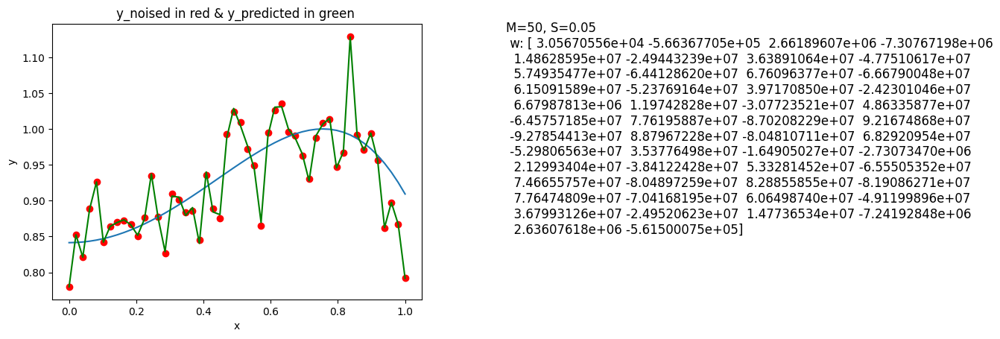

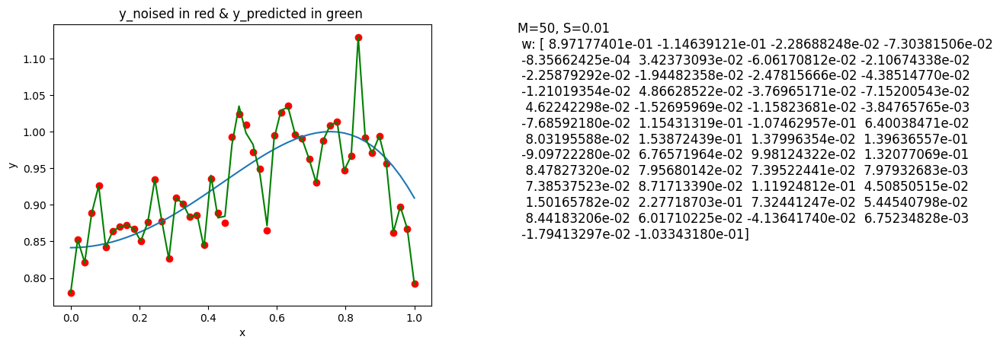

In [14]:
# Gaussian Basis函数
def gaussian_basis(x, mu, S):
    return np.exp(-(x - mu)**2 / (2 * S**2))

def generate_gaussian_Phim(x, M, S):
    mus = np.linspace(0, 1, M-1)
    matrix = np.array([gaussian_basis(x, mu, S) for mu in mus]).T
    matrix = np.insert(matrix, 0, 1, axis=1)
    return matrix

def calculate_gaussian_w(x, M, S, t):
    Phi = generate_gaussian_Phim(x, M, S)
    return np.linalg.pinv(Phi) @ t

M = [2, 5, 10, 20, 50]
S = [5, 2, 1, 0.1, 0.05, 0.01]

for Mi in M:
    for Sj in S:
        w = calculate_gaussian_w(x, Mi, Sj, y_noised)
        y_predicted =  generate_gaussian_Phim(x, Mi, Sj) @ w
        plt.scatter(x, y_noised,color='red')
        plt.plot(x, y)
        plt.plot(x, y_predicted, color='green')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.title('y_noised in red & y_predicted in green ')
        param_info = f'M={Mi}, S={Sj}\n w: {w}'
        plt.text(max(x) + 0.3, max(y), param_info, fontsize=12, verticalalignment='center')
        plt.show()


<mark>M = 50, S = 0.01 and M = 5, S = 0.1, are typical overfitting, <mark>

<mark>M = 2, S = ..., are typical underfitting<mark>

### Change the basis functions to the sigmoid basis functions

$ \phi_j(x_n) = \sigma(\frac{x_n-μ_j}{s}) $

$ \sigma(a) = \frac{1}{1+exp(-a)} $

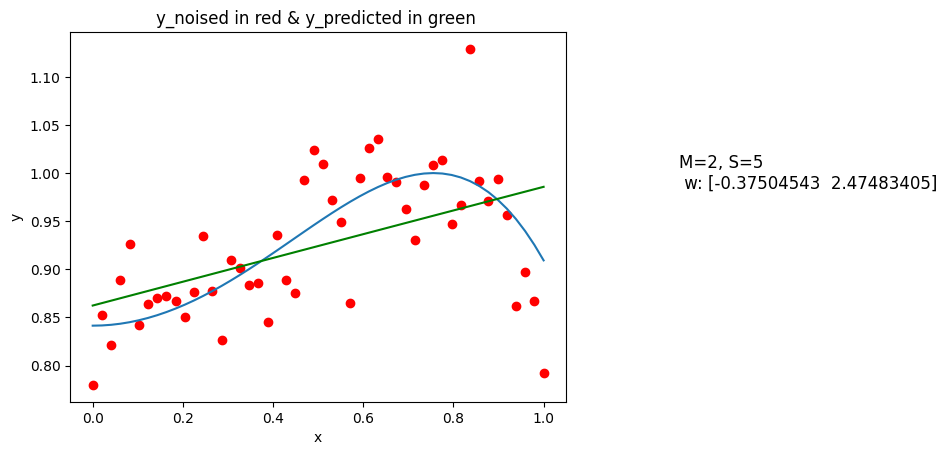

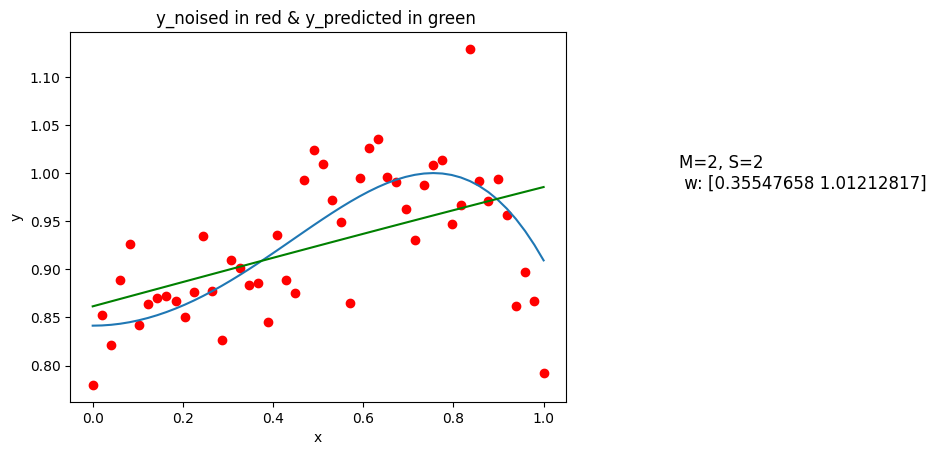

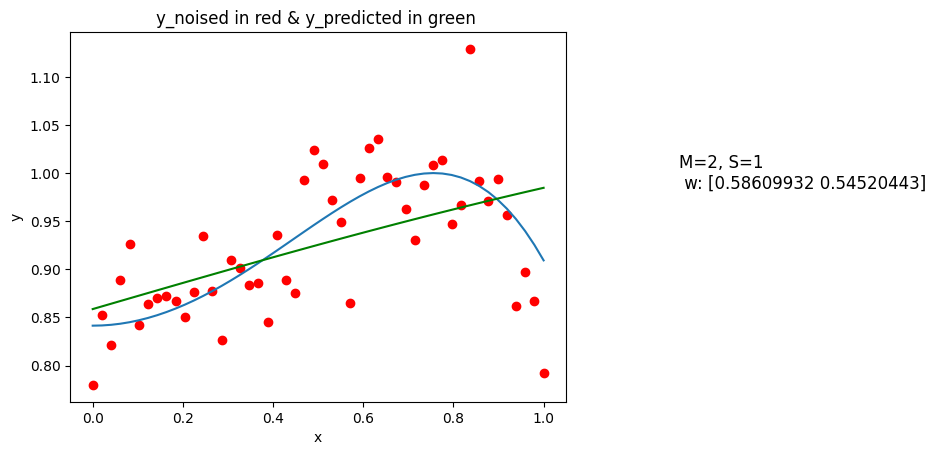

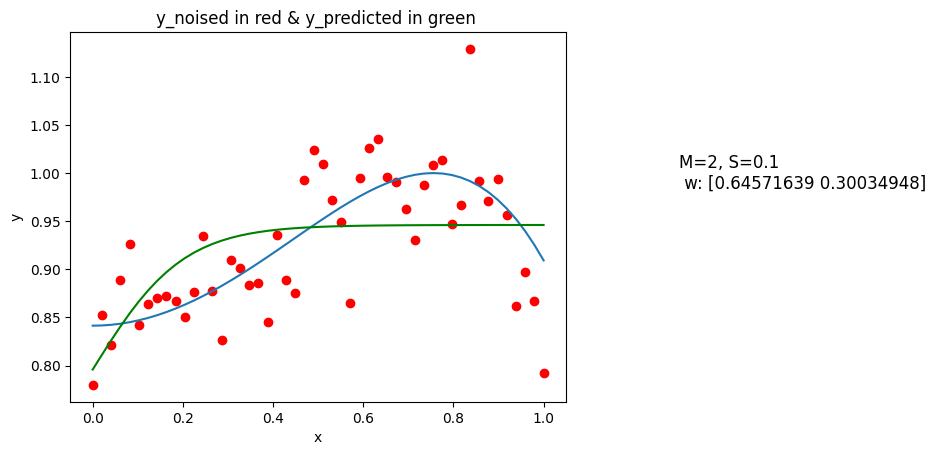

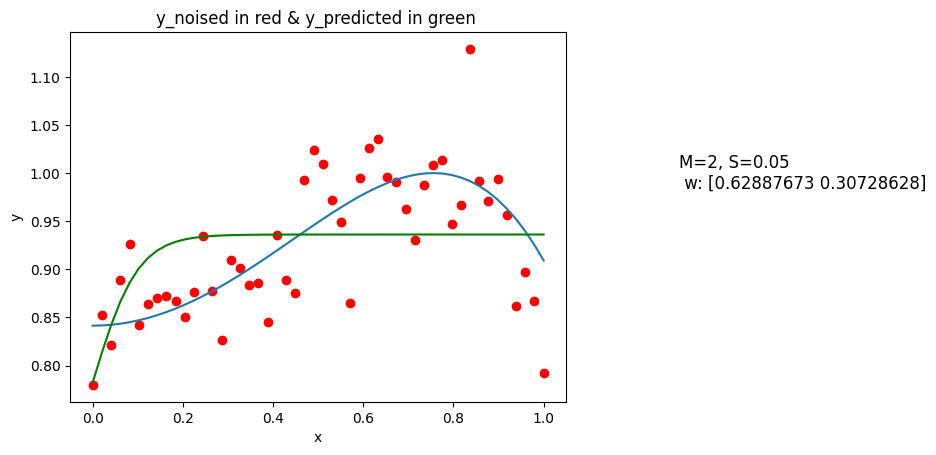

...

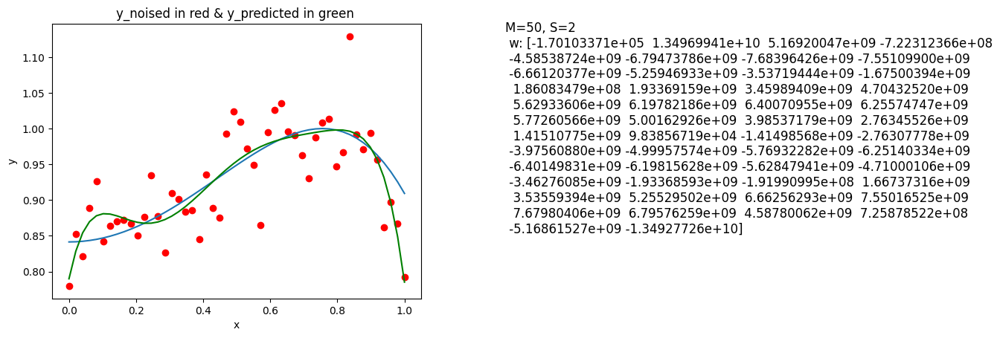

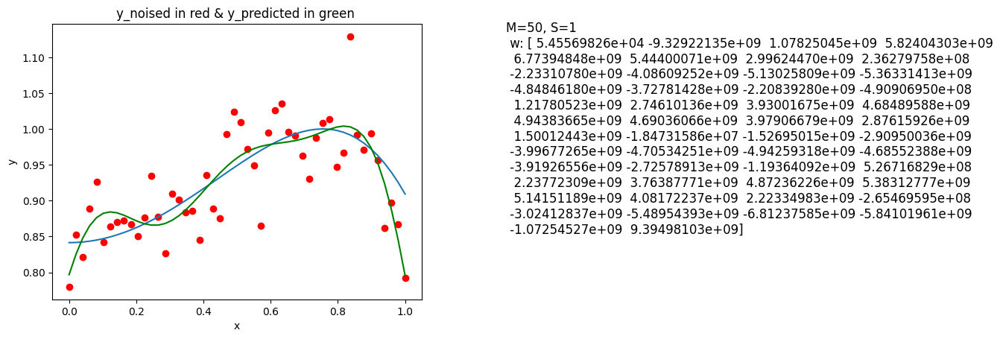

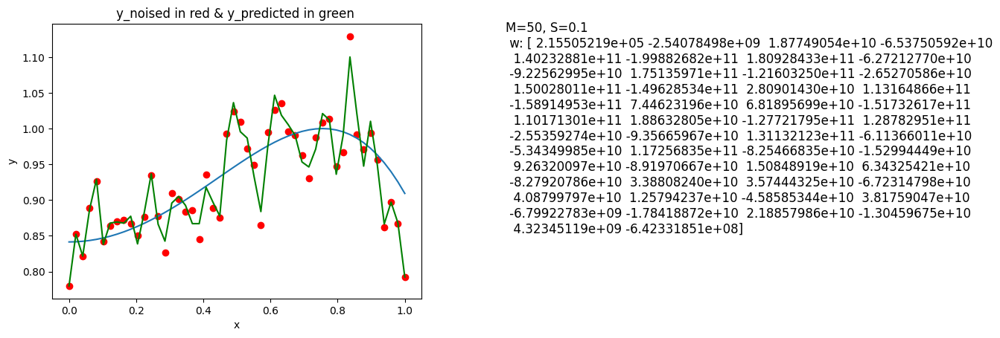

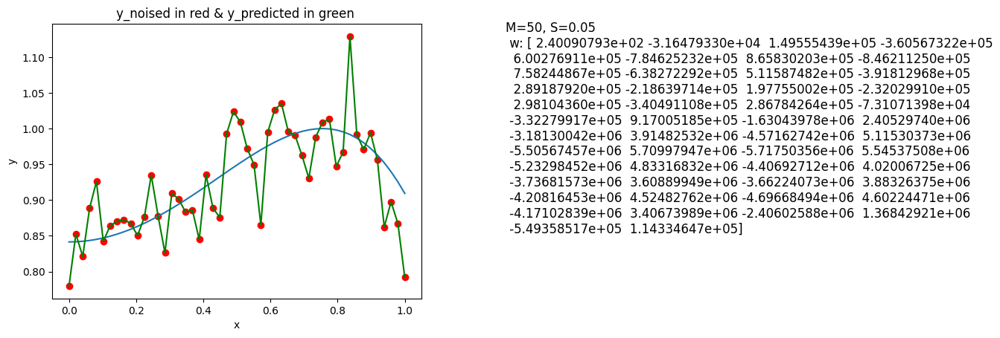

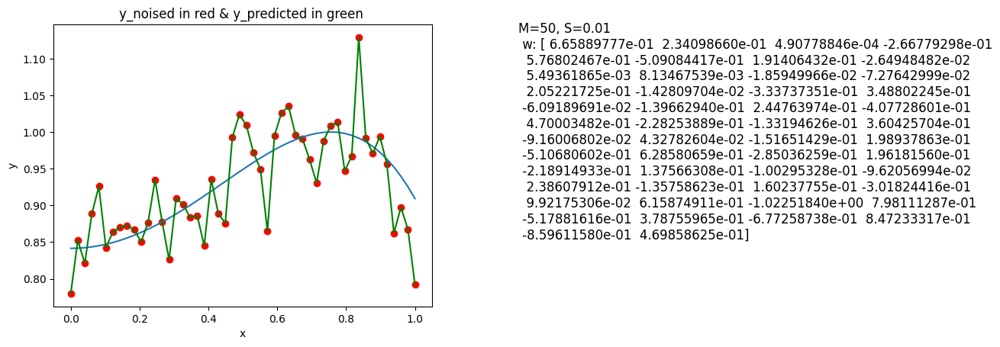

In [15]:
#sigma funciton
def sigma_a(a):
    return 1/(1+np.exp(-a))

def generate_sigmoid_Phim(x, M, S):
    mus = np.linspace(0, 1, M-1)
    matrix = np.array([sigma_a((x-mu)/S) for mu in mus]).T
    matrix = np.insert(matrix, 0, 1, axis=1)
    return matrix

def calculate_sigmoid_w(x, M, S, t):
    Phi = generate_sigmoid_Phim(x, M, S)
    return np.linalg.pinv(Phi) @ t

for Mi in M:
    for Sj in S:
        w = calculate_sigmoid_w(x, Mi, Sj, y_noised)
        y_predicted =  generate_sigmoid_Phim(x, Mi, Sj) @ w
        plt.scatter(x, y_noised,color='red')
        plt.plot(x, y)
        plt.plot(x, y_predicted, color='green')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.title('y_noised in red & y_predicted in green ')
        param_info = f'M={Mi}, S={Sj}\n w: {w}'
        plt.text(max(x) + 0.3, max(y), param_info, fontsize=12, verticalalignment='center')
        plt.show()

Change the original curve function to $ y=0.4345x^3-5.607x^2+16.78x-10.61 $

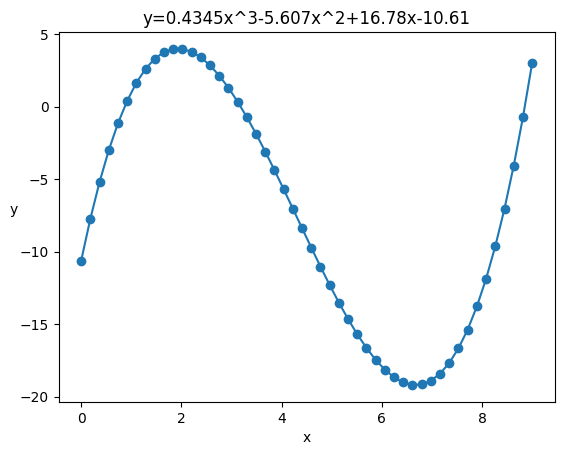

In [16]:
def polyfun(x):
    return 0.4345 * x**3 - 5.607 * x*x + 16.78 * x - 10.61

x = np.linspace(0, 9, 50)
y = polyfun(x)

noise = np.random.normal(0, 4, len(x))  # mean=0，standard deviation=4
y_noised = y + noise

plt.scatter(x, y)
plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('y', rotation=0)
plt.title('y=0.4345x^3-5.607x^2+16.78x-10.61')
plt.show()

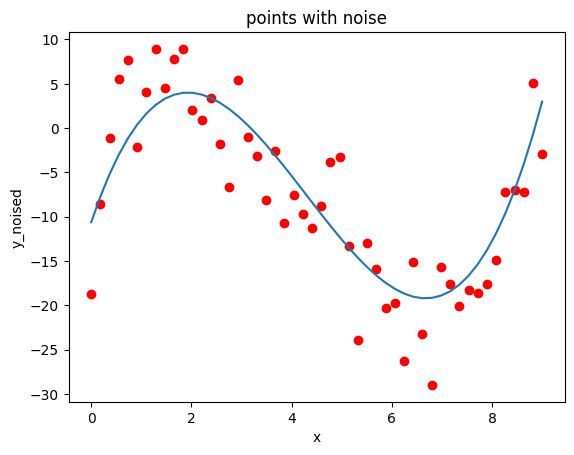

In [17]:
plt.scatter(x, y_noised,color='red')
plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('y_noised')
plt.title('points with noise')
plt.show()

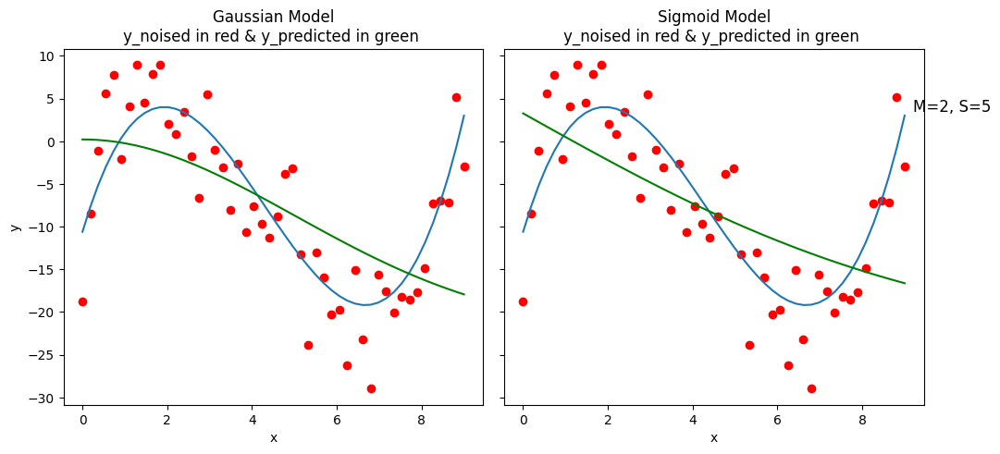

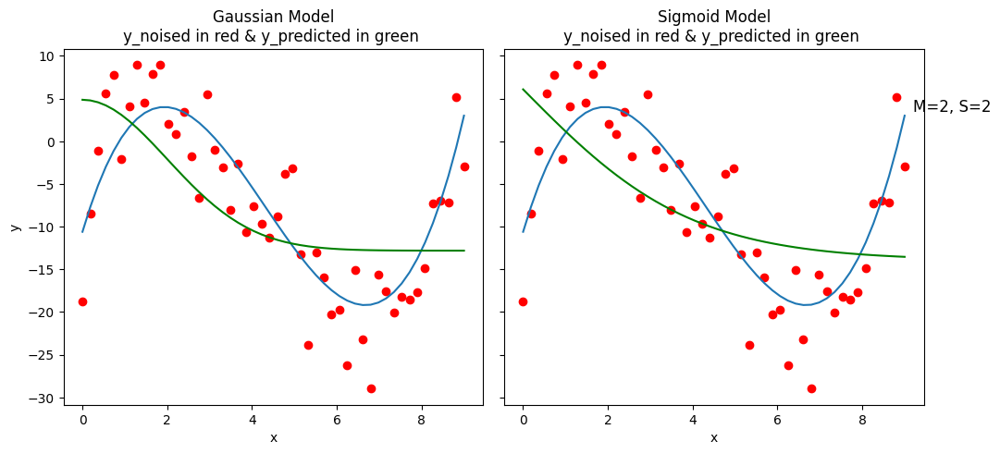

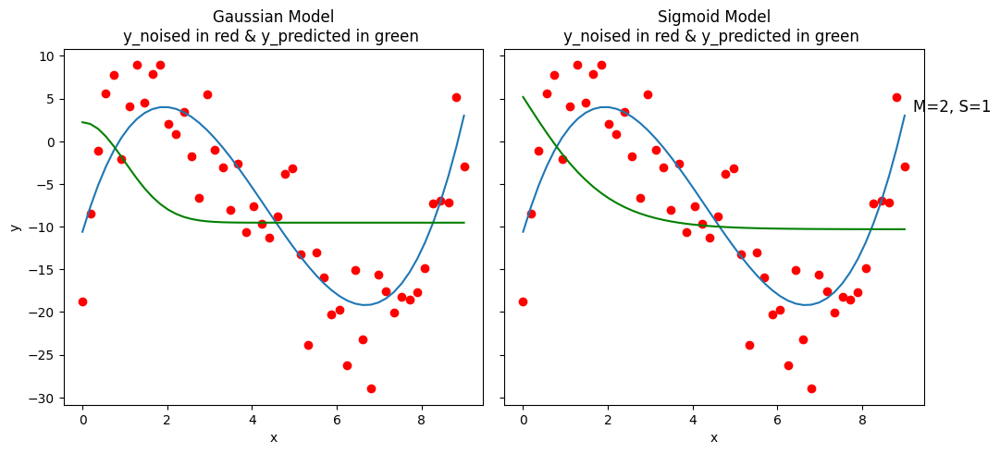

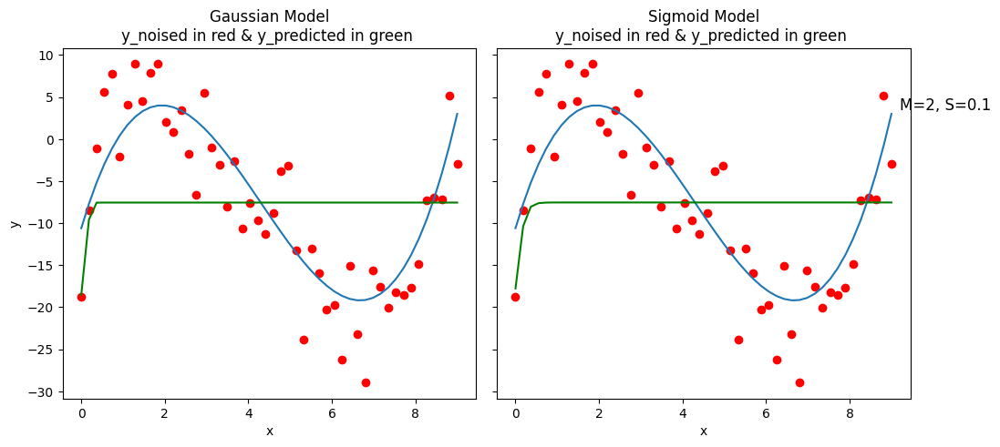

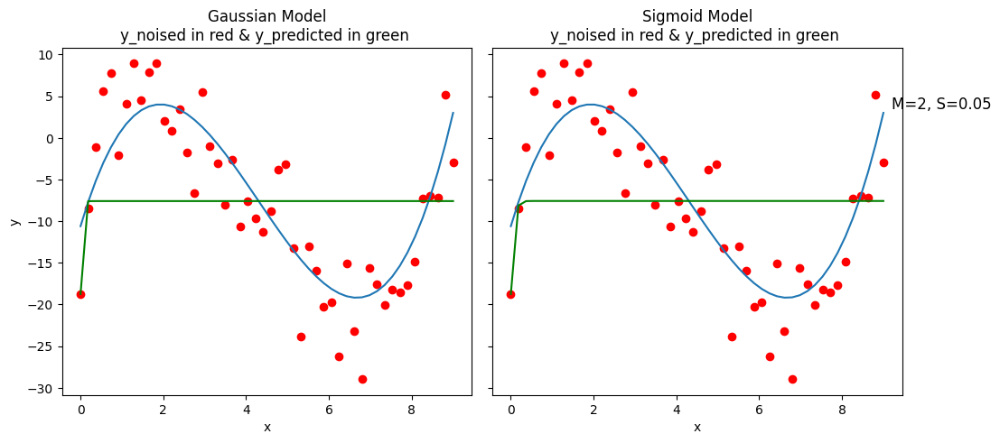

...

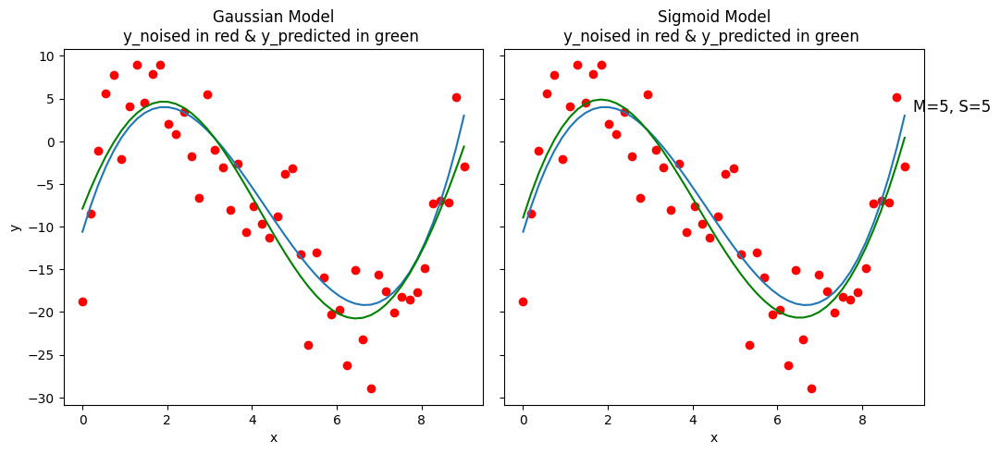

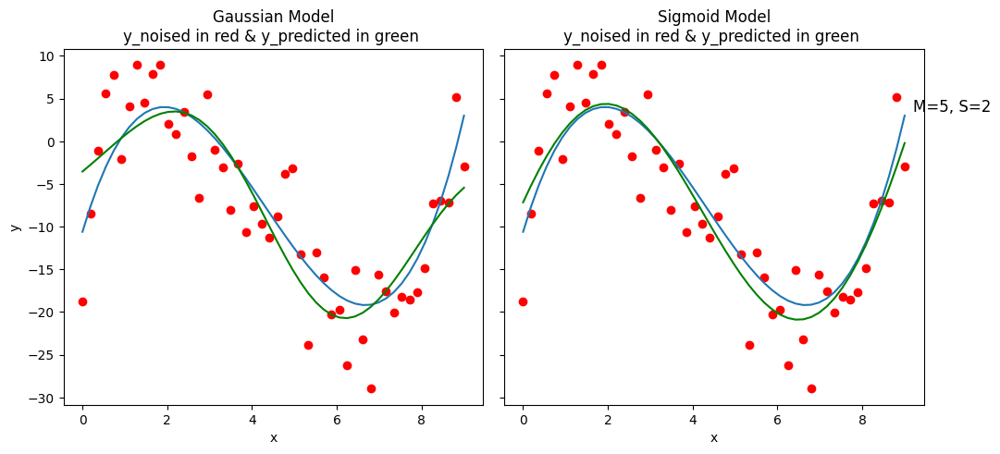

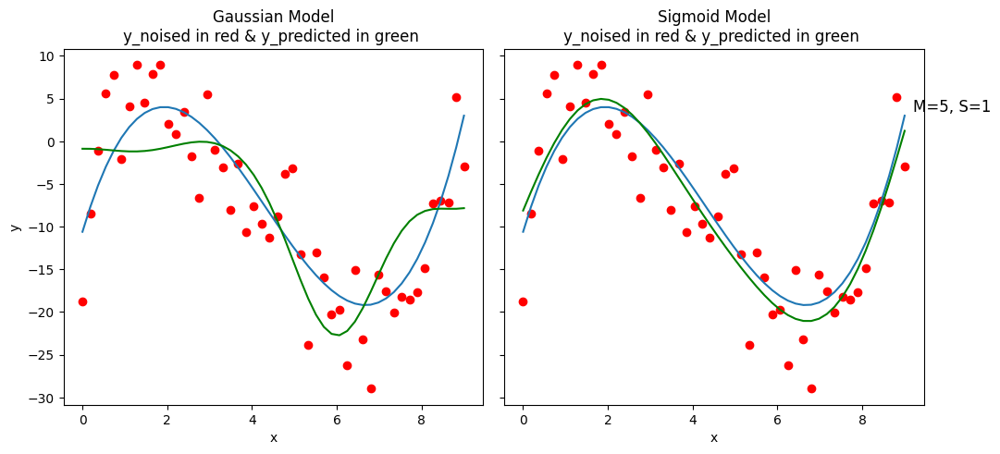

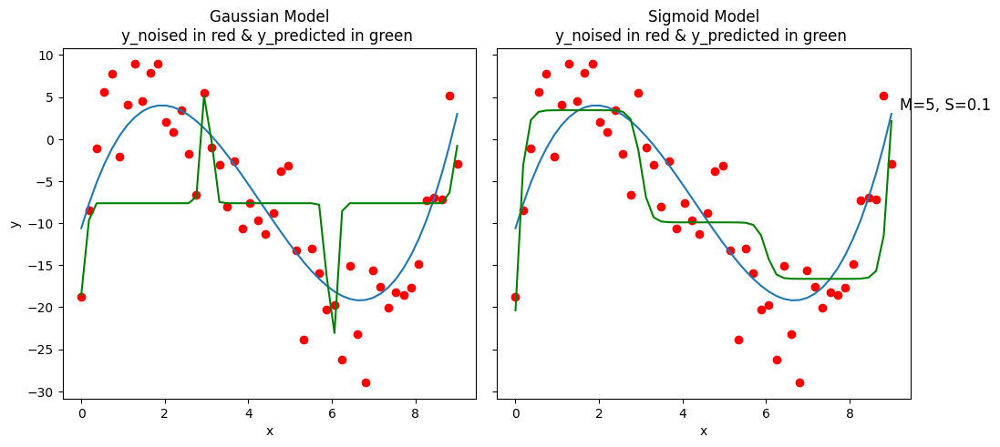

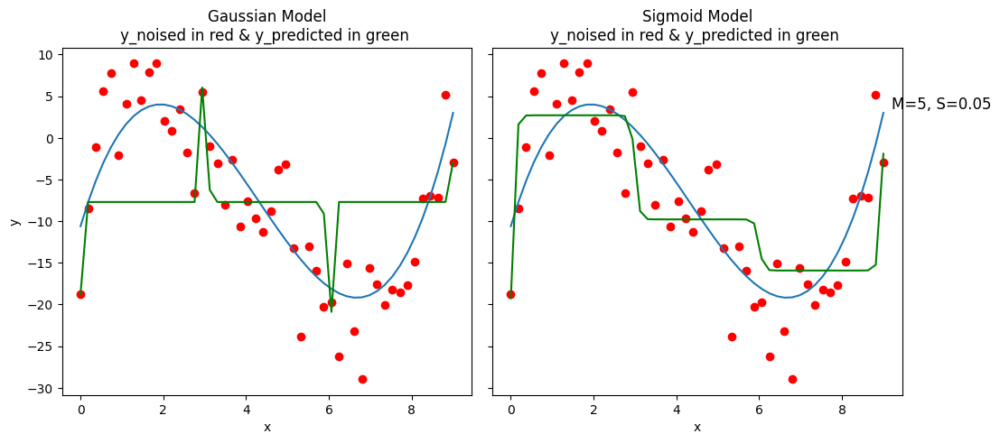

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_34812\2215743933.py:17: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-a))


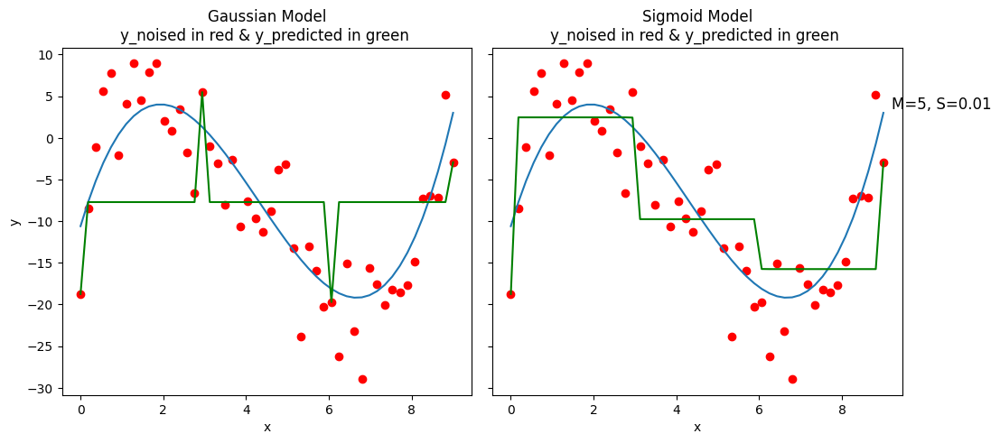

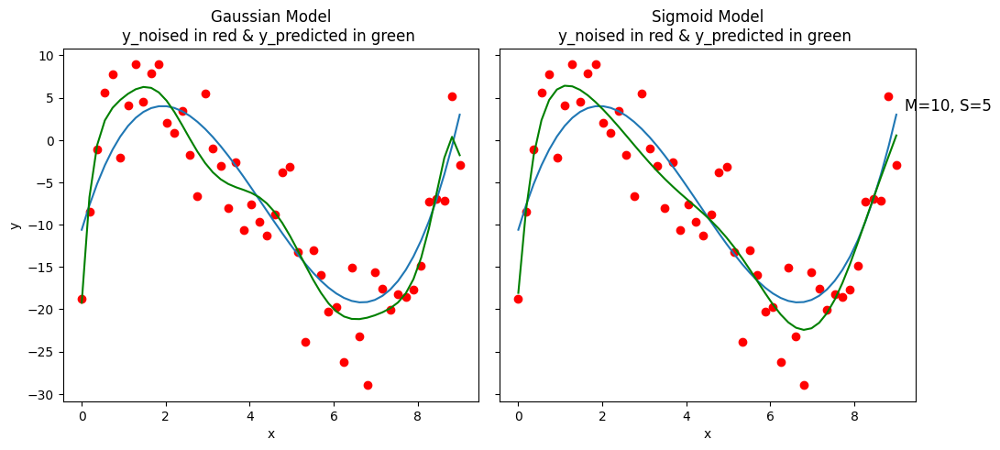

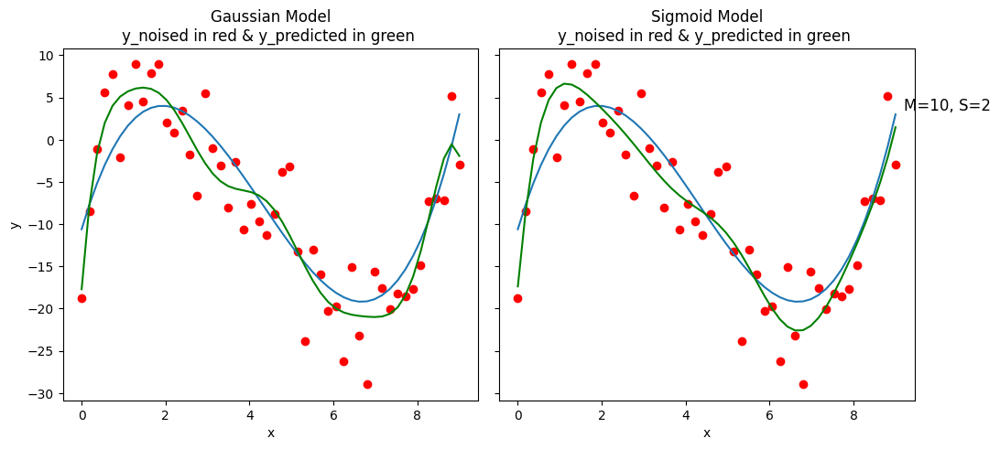

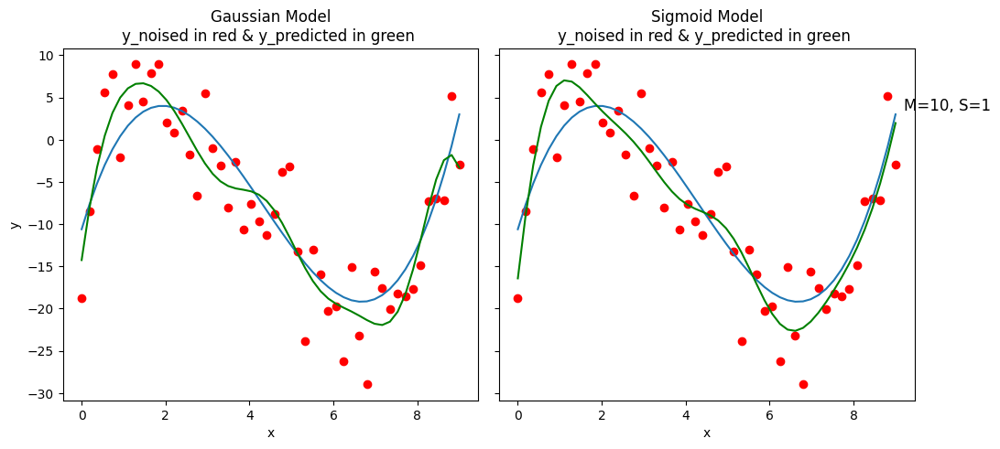

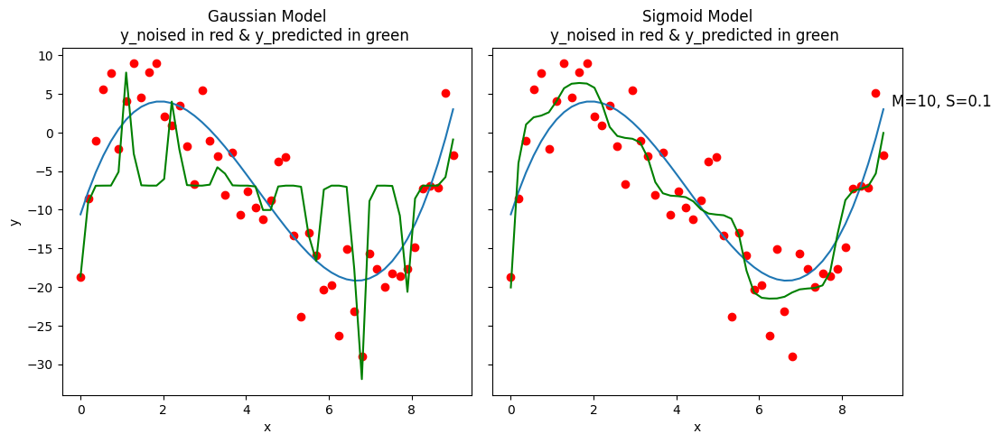

...

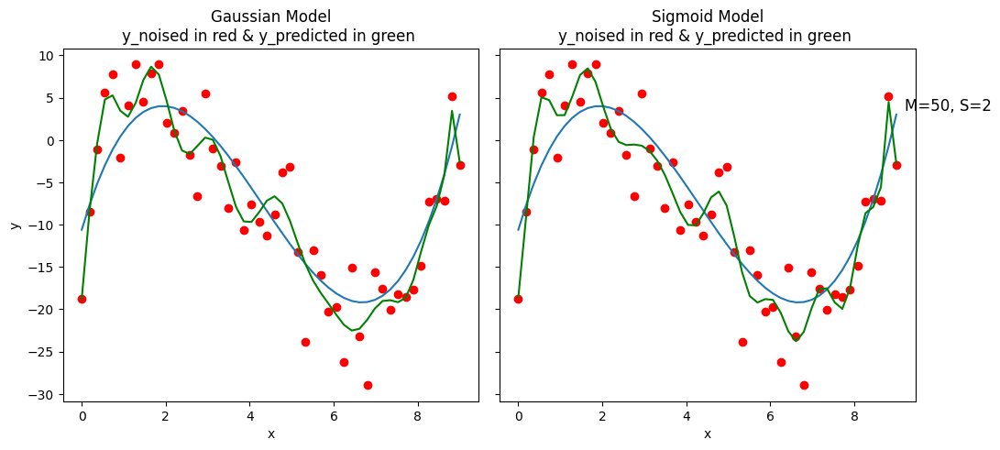

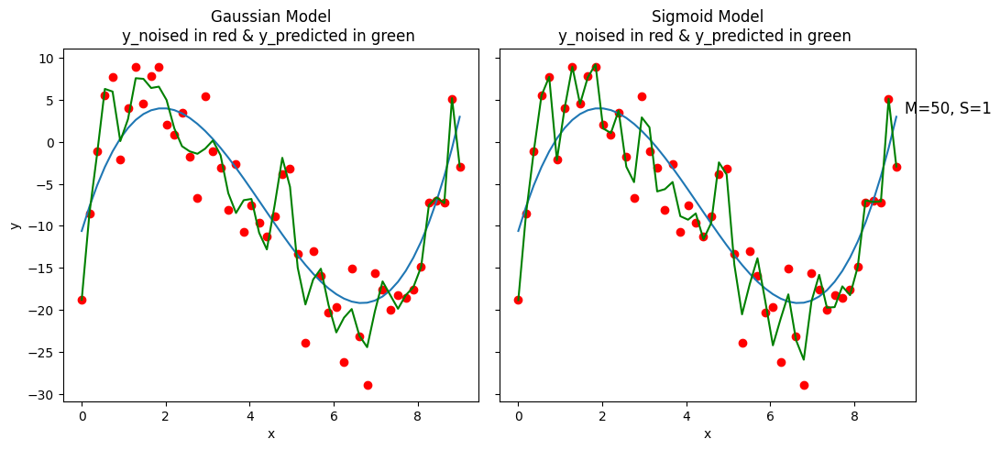

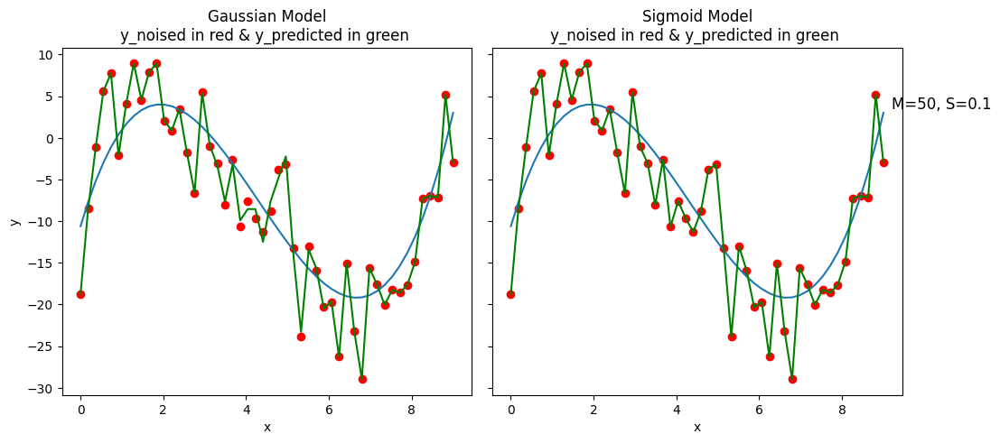

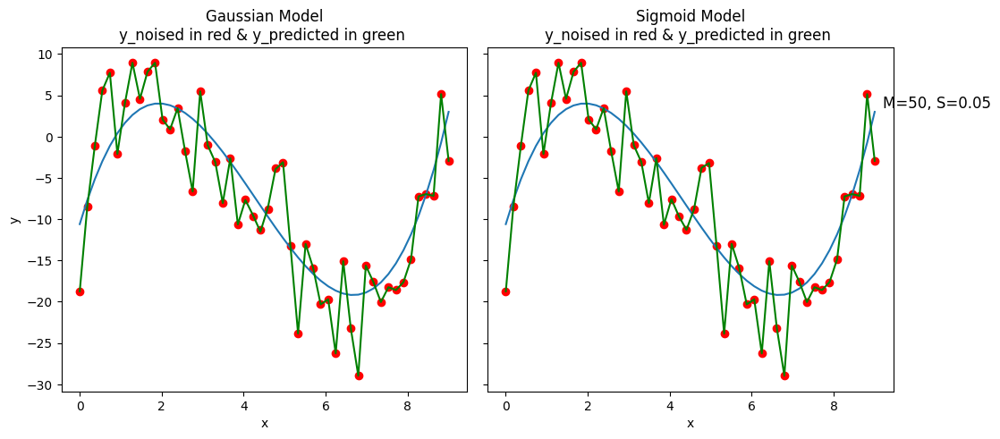

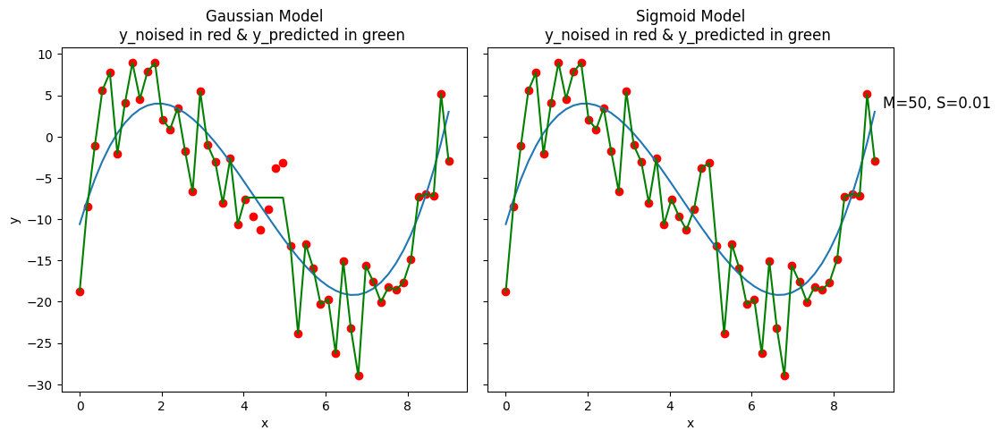

In [30]:
# Gaussian Basis函数
def gaussian_basis(x, mu, S):
    return np.exp(-(x - mu)**2 / (2 * S**2))

def generate_gaussian_Phim(x, M, S):
    mus = np.linspace(0, 9, M-1)
    matrix = np.array([gaussian_basis(x, mu, S) for mu in mus]).T
    matrix = np.insert(matrix, 0, 1, axis=1)
    return matrix

def calculate_gaussian_w(x, M, S, t):
    Phi = generate_gaussian_Phim(x, M, S)
    return np.linalg.pinv(Phi) @ t

#sigma funciton
def sigma_a(a):
    return 1/(1+np.exp(-a))

def generate_sigmoid_Phim(x, M, S):
    mus = np.linspace(0, 9, M-1)
    matrix = np.array([sigma_a((x-mu)/S) for mu in mus]).T
    matrix = np.insert(matrix, 0, 1, axis=1)
    return matrix

def calculate_sigmoid_w(x, M, S, t):
    Phi = generate_sigmoid_Phim(x, M, S)
    return np.linalg.pinv(Phi) @ t

M = [2, 5, 10, 20, 50]
S = [5, 2, 1, 0.1, 0.05, 0.01]

for Mi in M:
    for Sj in S:
        w_gaussian = calculate_gaussian_w(x, Mi, Sj, y_noised)
        y_gaussian_predicted =  generate_gaussian_Phim(x, Mi, Sj) @ w_gaussian
        w_sigmoid = calculate_sigmoid_w(x, Mi, Sj, y_noised)
        y_sigmoid_predicted =  generate_sigmoid_Phim(x, Mi, Sj) @ w_sigmoid 
        
        # 创建一个具有两个子图的画布，并设置子图之间的水平间距和垂直间距
        fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
        fig.subplots_adjust(wspace=0.05)  # 调整子图之间的水平间距

        # 第一个子图
        axes[0].scatter(x, y_noised, color='red')
        axes[0].plot(x, y)
        axes[0].plot(x, y_gaussian_predicted, color='green')
        axes[0].set_xlabel('x')
        axes[0].set_ylabel('y')
        axes[0].set_title('Gaussian Model\ny_noised in red & y_predicted in green ')

        # 第二个子图
        axes[1].scatter(x, y_noised, color='red')
        axes[1].plot(x, y)
        axes[1].plot(x, y_sigmoid_predicted, color='green')
        axes[1].set_xlabel('x')
        axes[1].set_title('Sigmoid Model\ny_noised in red & y_predicted in green ')
        
        param_info = f'M={Mi}, S={Sj}'
        plt.text(max(x) + 0.2, max(y), param_info, fontsize=12, verticalalignment='center')
        plt.show()
        
        # 显示子图
        plt.show()

### Difference
<mark>When M = 2(M is small)
Gaussian Model has more bends than Sigmoid Model. Theoretically, the M value represents the number of Gaussian peaks and troughs in the Gaussian model, and the number of impulses in the sigmoid model (one wave peak has two impulses, and the relative impulses are symmetrical, that is to say there will be less flexibility). So, in the case where M is larger and S is smaller, the fitting function of the Gaussian kernel performs worse than the sigmoid function. It is most obvious in the set of pictures with M=20 and S=0.1/0.05/0.01. Overall, in the better-fitting group of images, the Gaussian model and the sigmoid model have similar image features.<mark>

### Advantages
<mark>Polynomials are more prone to overfitting than Gaussian and sigmoid. Gaussian and sigmoid are nonlinear functions that can better capture nonlinear complex relationships in the real world.<mark>

<mark>Gaussian and sigmoid models have hyperparameters that can be adjusted for specific problems, while polynomial models cannot be adjusted.<mark>

## Part 3: FULL BAYESIAN + PREDICTIVE DISTRIBUTION

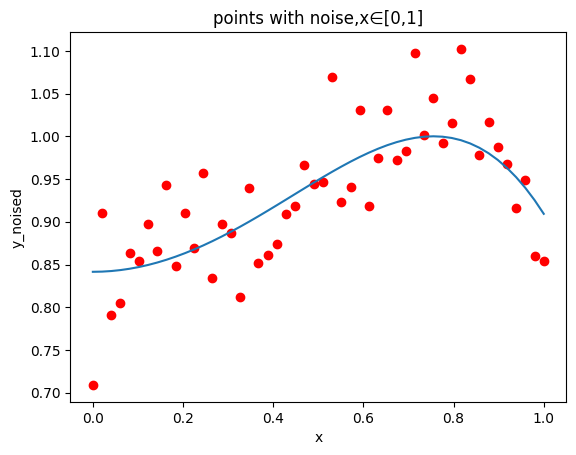

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def func(x):
    return np.sin(x**2 + 1)

x = np.linspace(0, 1, 50)
y = func(x)

noise = np.random.normal(0, 0.05, len(x))  # mean=0，standard deviation=0.05
y_noised = y + noise

plt.scatter(x, y_noised,color='red')
plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('y_noised')
plt.title('points with noise,x∈[0,1]')
plt.show()

In full Bayesian Inference for Regression
m

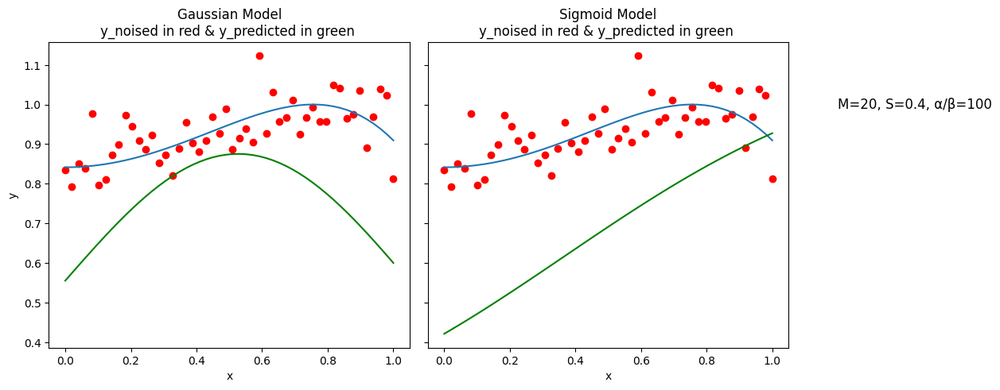

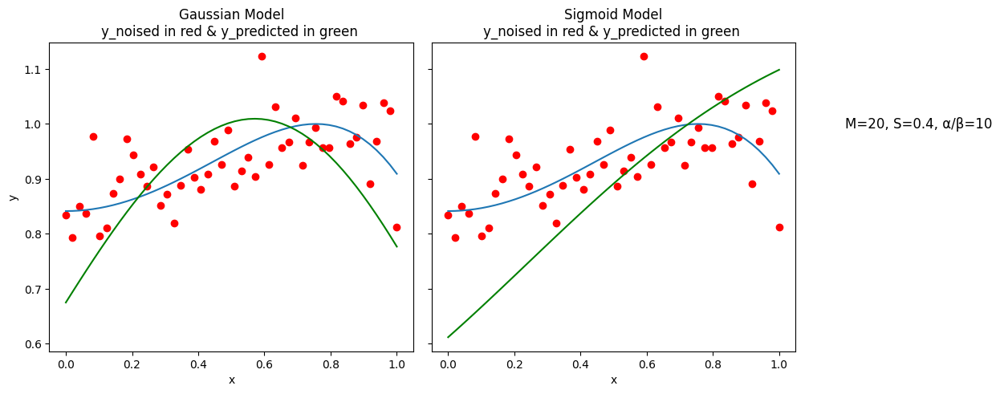

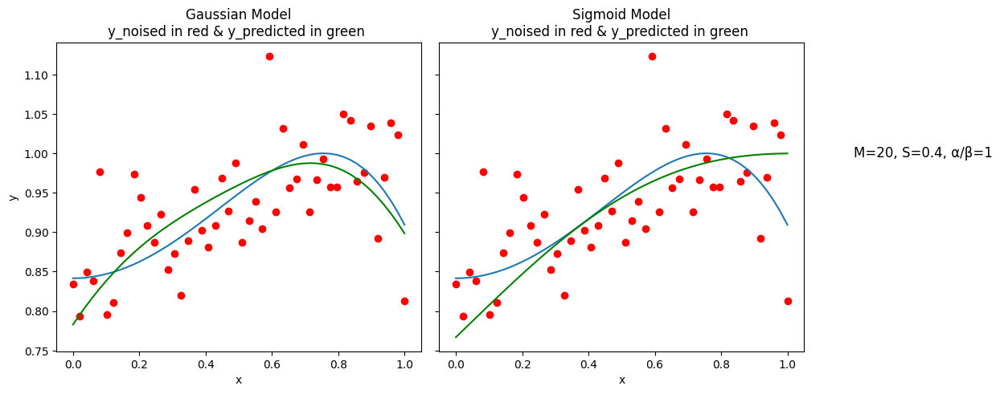

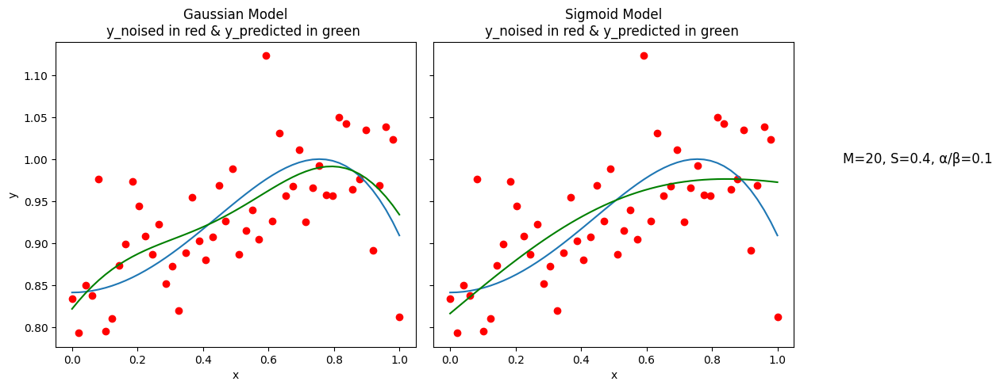

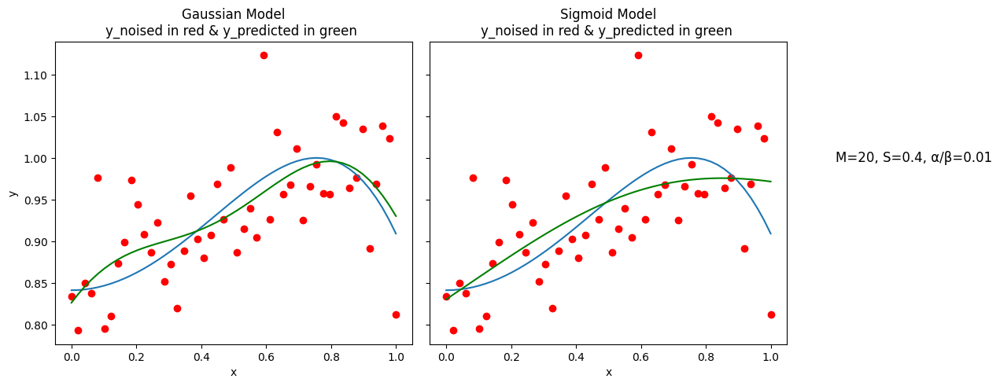

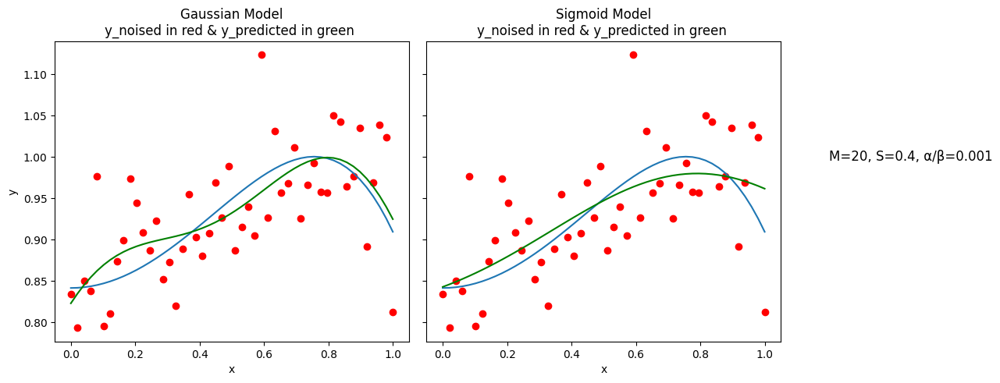

In [10]:
##### Gaussian Basis函数
def gaussian_basis(x, mu, S):
    return np.exp(-(x - mu)**2 / (2 * S**2))

def generate_gaussian_Phim(x, M, S):
    mus = np.linspace(0, 1, M-1)
    matrix = np.array([gaussian_basis(x, mu, S) for mu in mus]).T
    matrix = np.insert(matrix, 0, 1, axis=1)
    return matrix

def calculate_gaussian_w(x, M, S, t, aphDbetai):
    Phi = generate_gaussian_Phim(x, M, S)
    return np.linalg.inv(aphDbetai * np.identity(M) + Phi.T @ Phi) @ Phi.T @ t

#sigma funciton
def sigma_a(a):
    return 1/(1+np.exp(-a))

def generate_sigmoid_Phim(x, M, S):
    mus = np.linspace(0, 1, M-1)
    matrix = np.array([sigma_a((x-mu)/S) for mu in mus]).T
    matrix = np.insert(matrix, 0, 1, axis=1)
    return matrix

def calculate_sigmoid_w(x, M, S, t, aphDbetai):
    Phi = generate_sigmoid_Phim(x, M, S)
    return np.linalg.inv(aphDbetai * np.identity(M) + Phi.T @ Phi) @ Phi.T @ t

M = 20
S = 0.4

aDb = [100, 10, 1, 0.1, 0.01, 0.001,]

for aDbi in aDb:
    w_gaussian = calculate_gaussian_w(x, M, S, y_noised, aDbi)
    y_gaussian_predicted =  generate_gaussian_Phim(x, M, S) @ w_gaussian
    w_sigmoid = calculate_sigmoid_w(x, M, S, y_noised, aDbi)
    y_sigmoid_predicted =  generate_sigmoid_Phim(x, M, S) @ w_sigmoid 
    
    # 创建一个具有两个子图的画布，并设置子图之间的水平间距和垂直间距
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
    fig.subplots_adjust(wspace=0.05)  # 调整子图之间的水平间距

    # 第一个子图
    axes[0].scatter(x, y_noised, color='red')
    axes[0].plot(x, y)
    axes[0].plot(x, y_gaussian_predicted, color='green')
    axes[0].set_xlabel('x')
    axes[0].set_ylabel('y')
    axes[0].set_title('Gaussian Model\ny_noised in red & y_predicted in green ')

    # 第二个子图
    axes[1].scatter(x, y_noised, color='red')
    axes[1].plot(x, y)
    axes[1].plot(x, y_sigmoid_predicted, color='green')
    axes[1].set_xlabel('x')
    axes[1].set_title('Sigmoid Model\ny_noised in red & y_predicted in green ')
    
    param_info = f'M={M}, S={S}, α/β={aDbi}'
    plt.text(max(x) + 0.2, max(y), param_info, fontsize=12, verticalalignment='center')
    plt.show()
    
    # 显示子图
    plt.show()

M = 20, S = 0.4, β/α = 0.1 Gaussian Model & M = 20, S = 0.4, β/α = 0.001 Sigmoid Model achieved the best fitting results.
α->0, the mean $ m_N $ of posterior distribution reduces to the maximum likelihood value $ w_{ML} $ 
And if α/β is large, some of the coefficients basis functions play mp role. It appears in the feagure that it is smoother.

p(w|t) provide the uncertainty about the fitting curve in the training stage which can be used to judge the quality curve. In testing stage, it to measure the confidence of prediction. So if the prediction's confidence is not high, you might try to use other options.

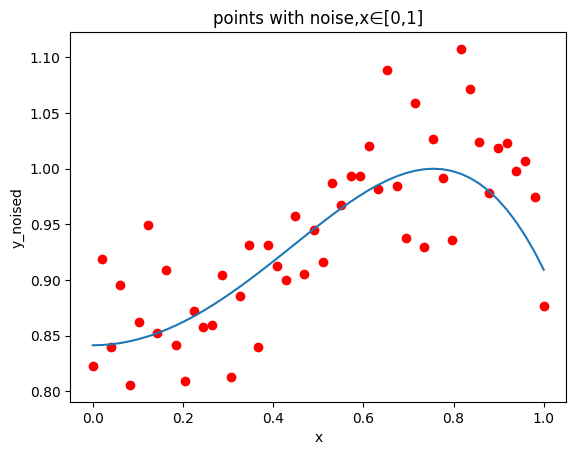

In [20]:
import numpy as np
import matplotlib.pyplot as plt

def func(x):
    return np.sin(x**2 + 1)

x = np.linspace(0, 1, 50)
y = func(x)

noise = np.random.normal(0, 0.05, len(x))  # mean=0，standard deviation=0.05
y_noised = y + noise

plt.scatter(x, y_noised,color='red')
plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('y_noised')
plt.title('points with noise,x∈[0,1]')
plt.show()

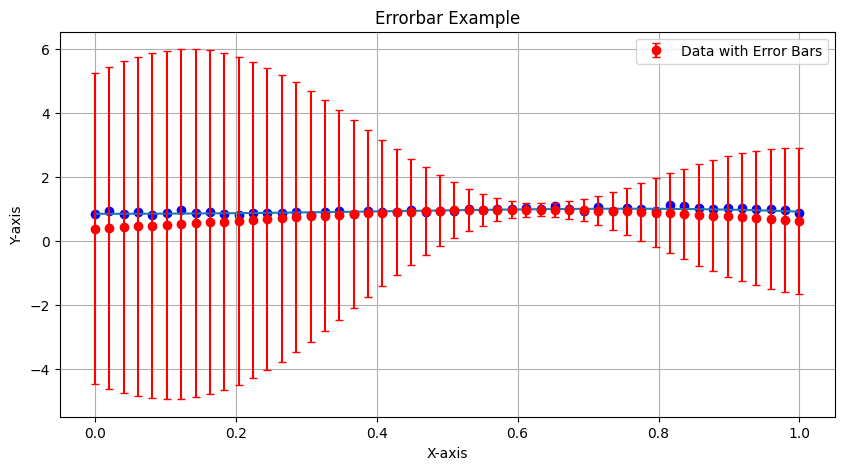

[31]


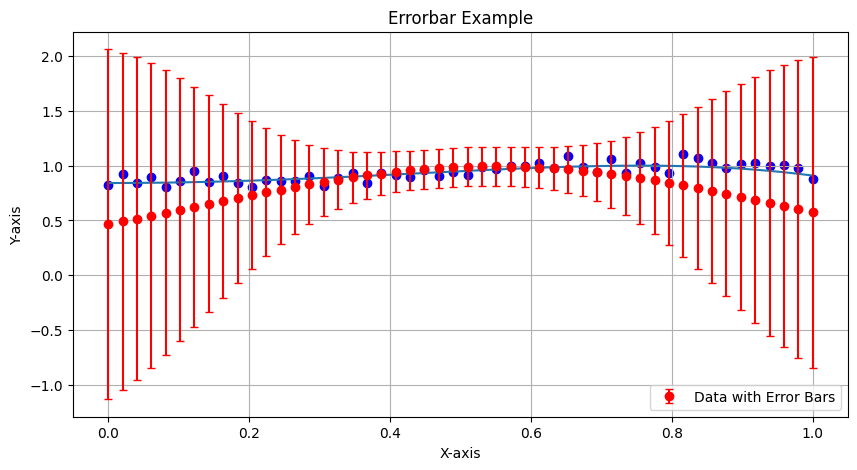

[31 19]


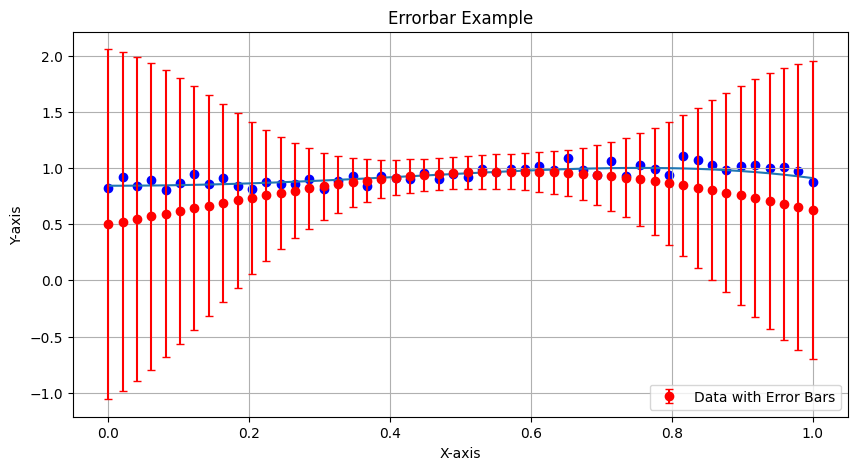

[31 19 23]


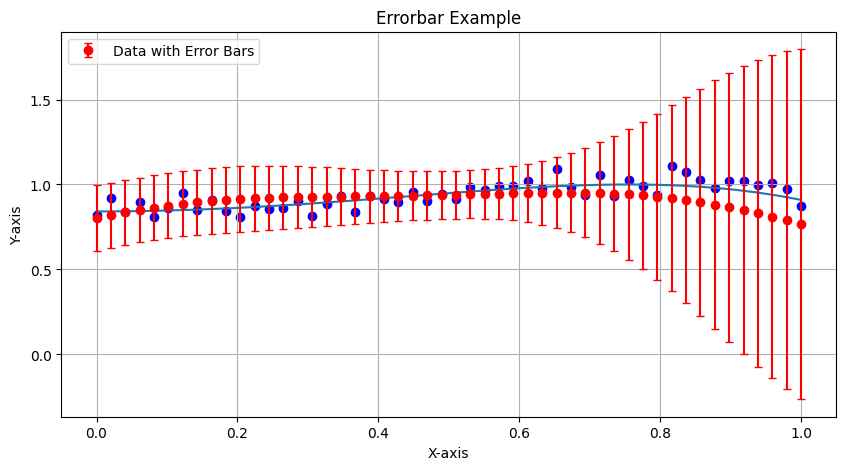

[31 19 23  0]


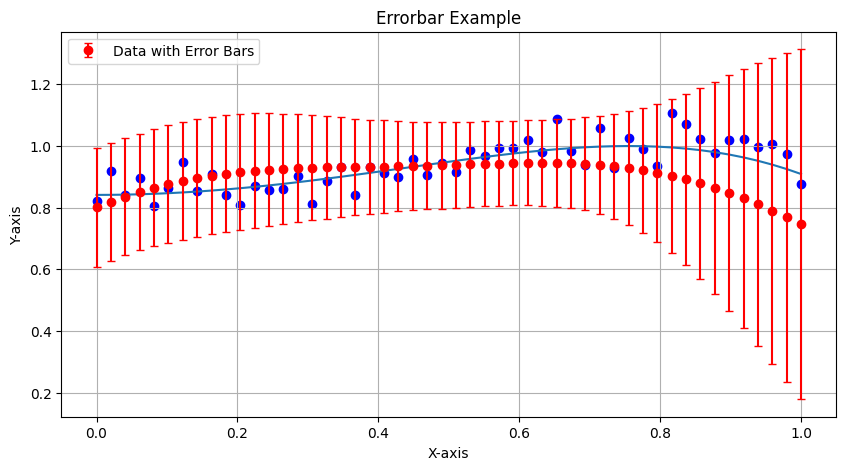

[31 19 23  0 36]


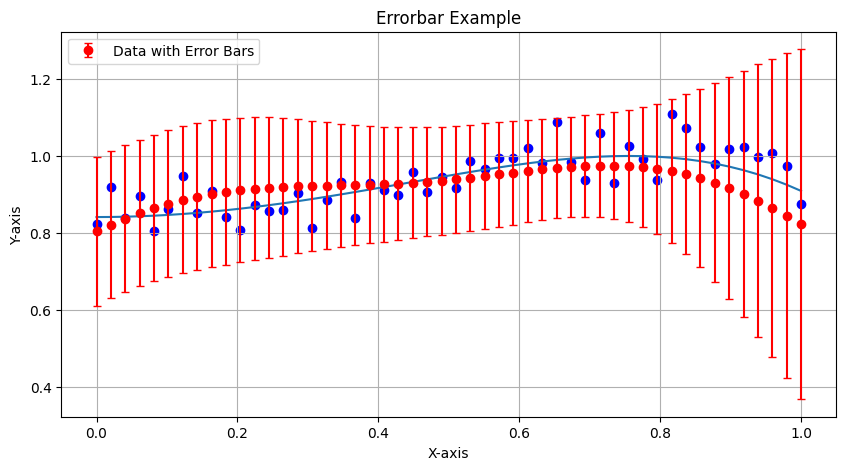

[31 19 23  0 36 37]


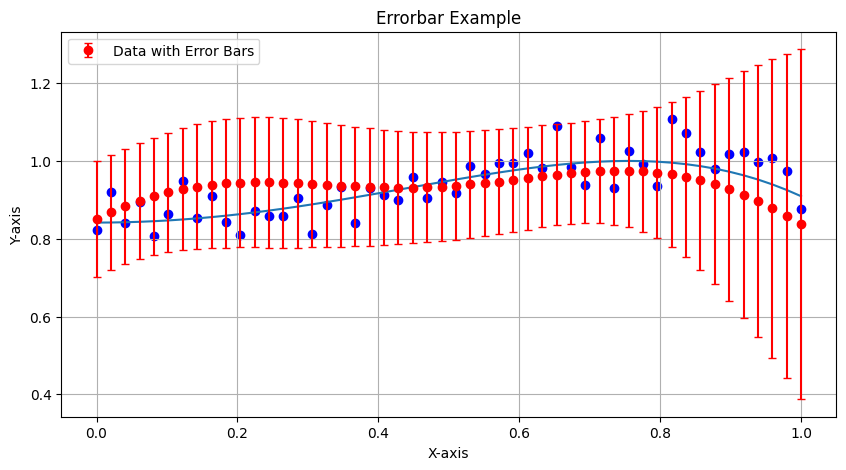

[31 19 23  0 36 37  1]


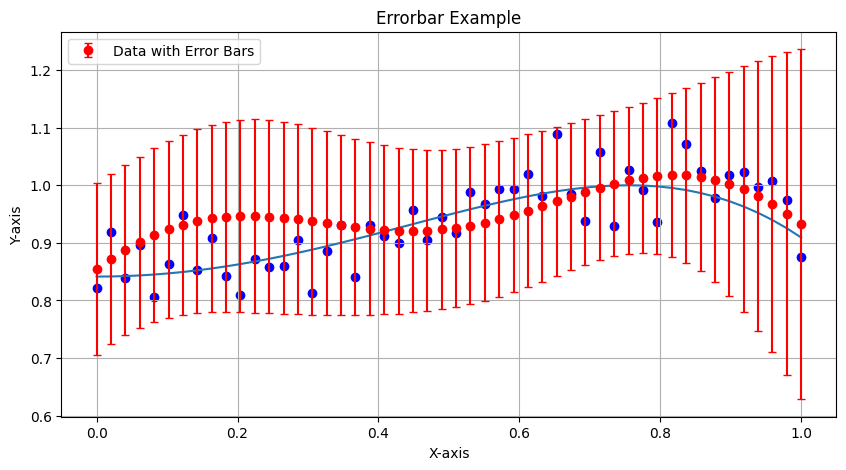

[31 19 23  0 36 37  1 41]


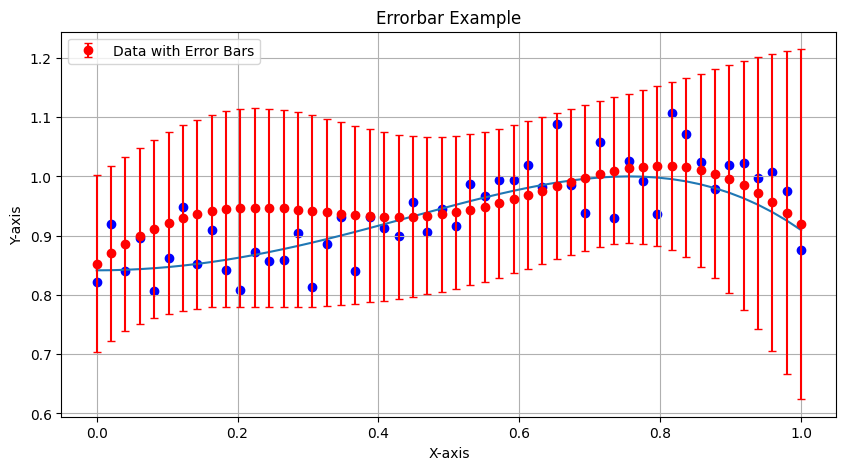

[31 19 23  0 36 37  1 41 28]


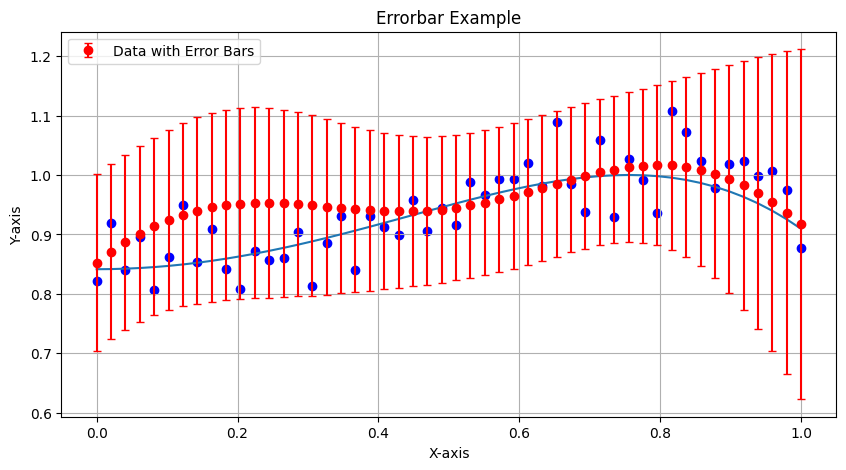

[31 19 23  0 36 37  1 41 28 22]


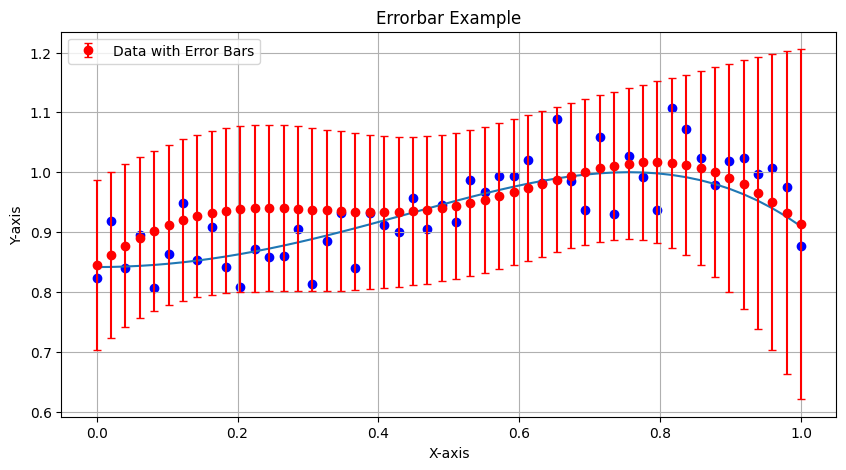

[31 19 23  0 36 37  1 41 28 22  8]


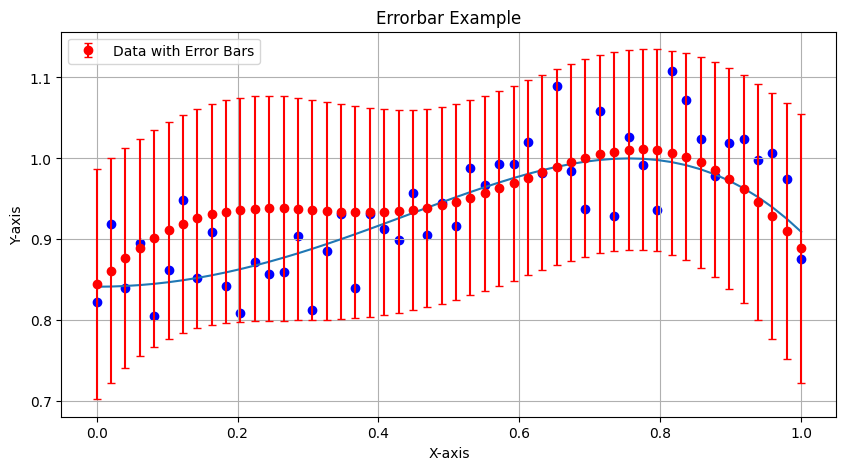

[31 19 23  0 36 37  1 41 28 22  8 49]


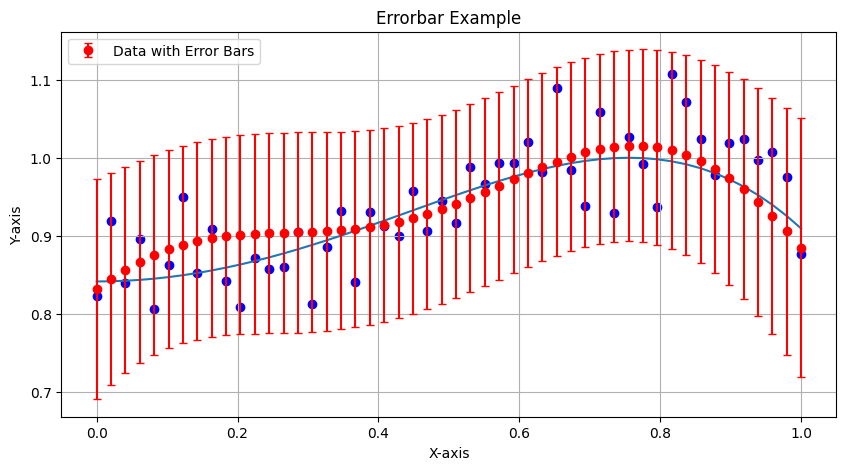

[31 19 23  0 36 37  1 41 28 22  8 49 10]


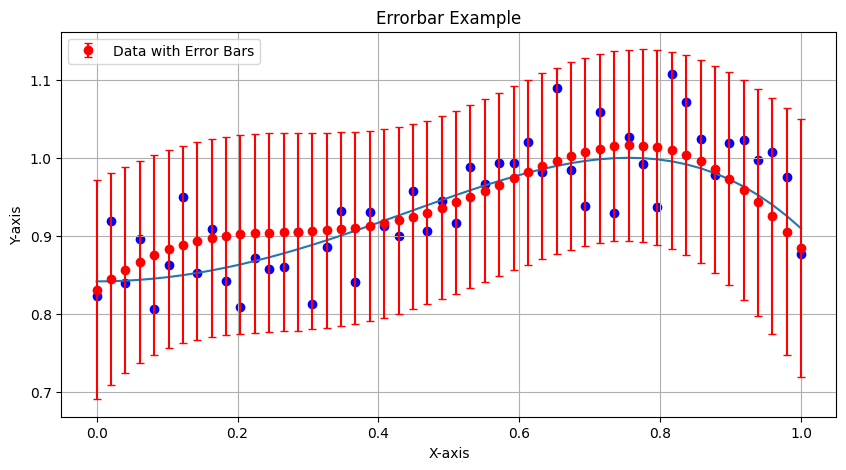

[31 19 23  0 36 37  1 41 28 22  8 49 10 24]


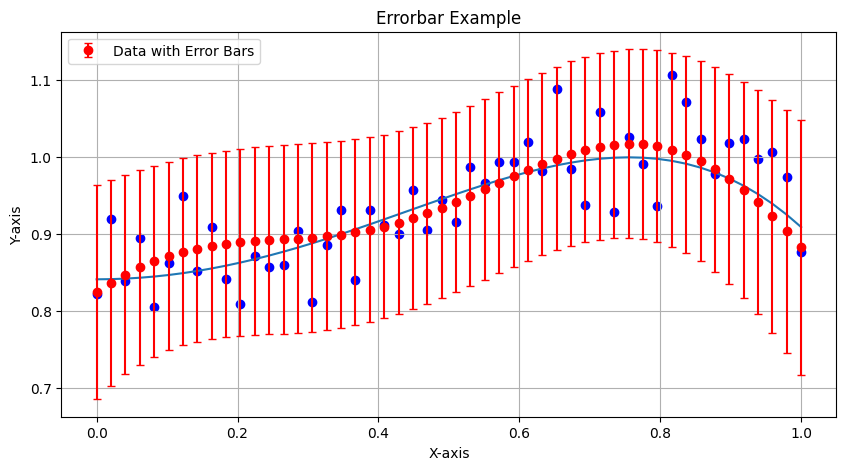

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9]


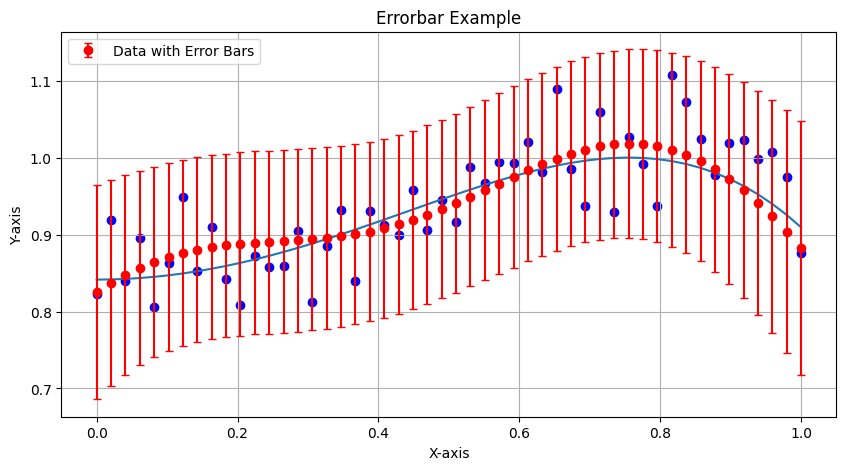

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16]


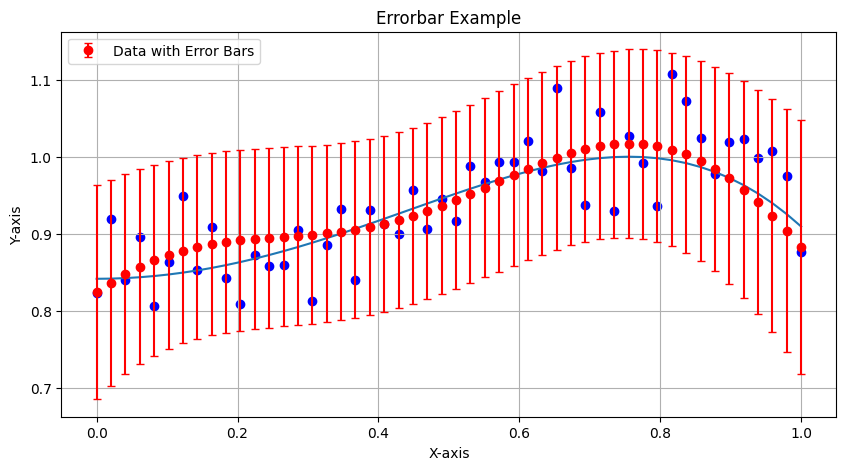

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17]


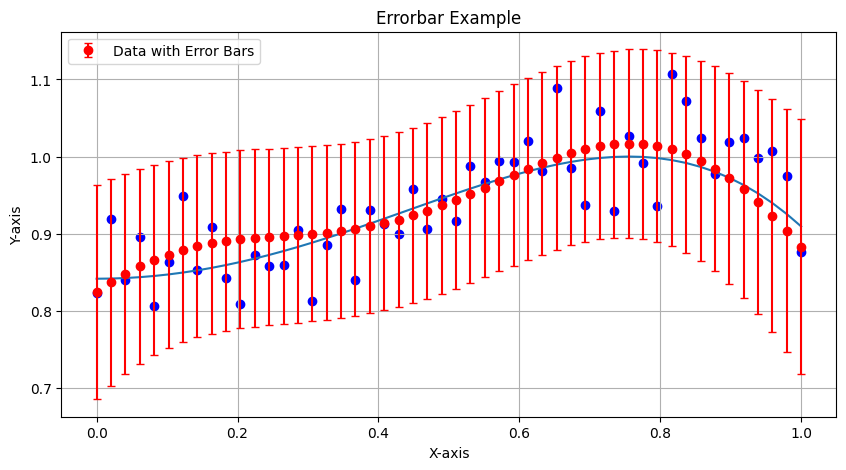

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14]


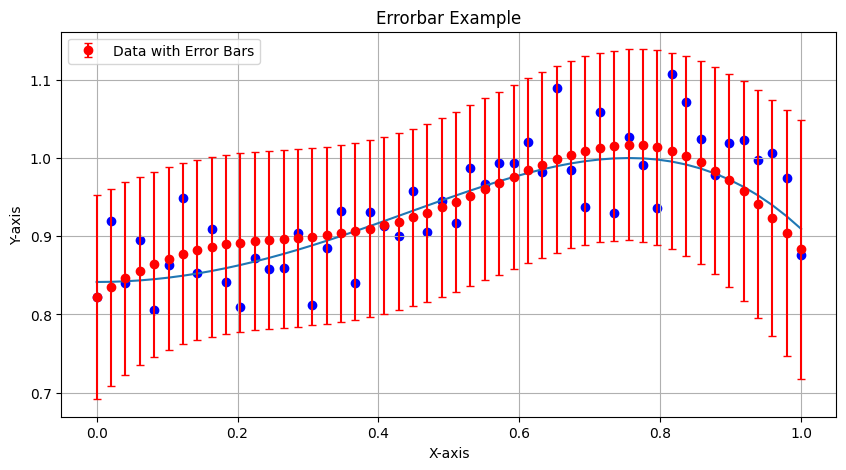

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2]


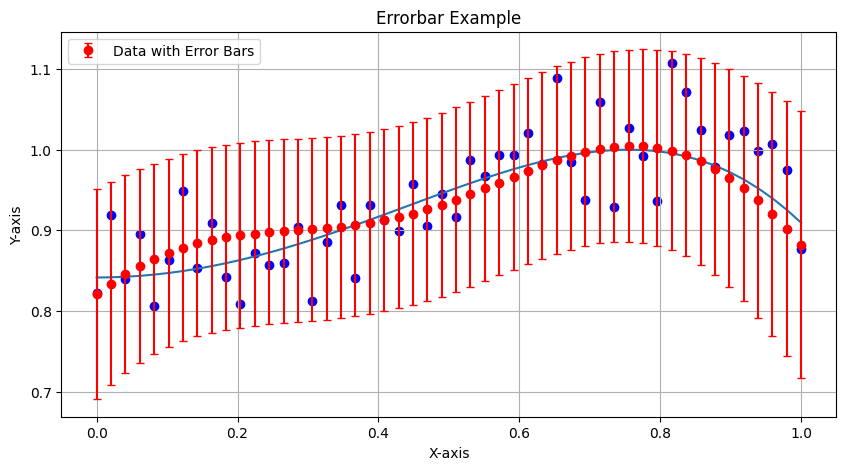

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34]


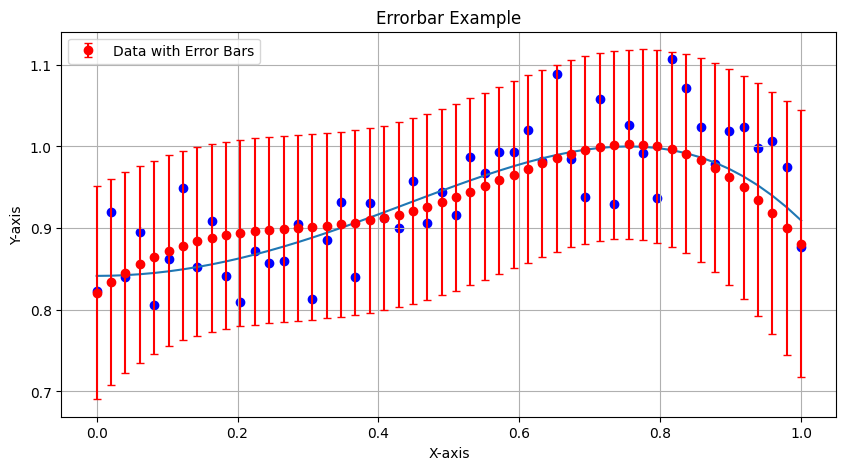

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38]


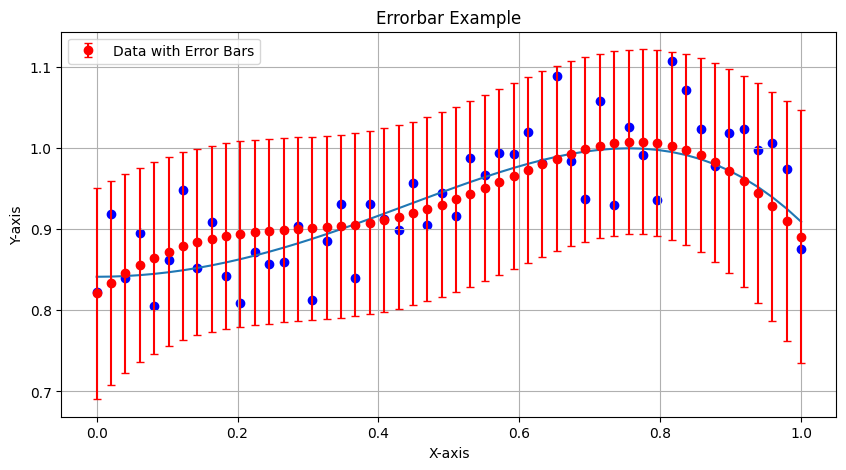

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42]


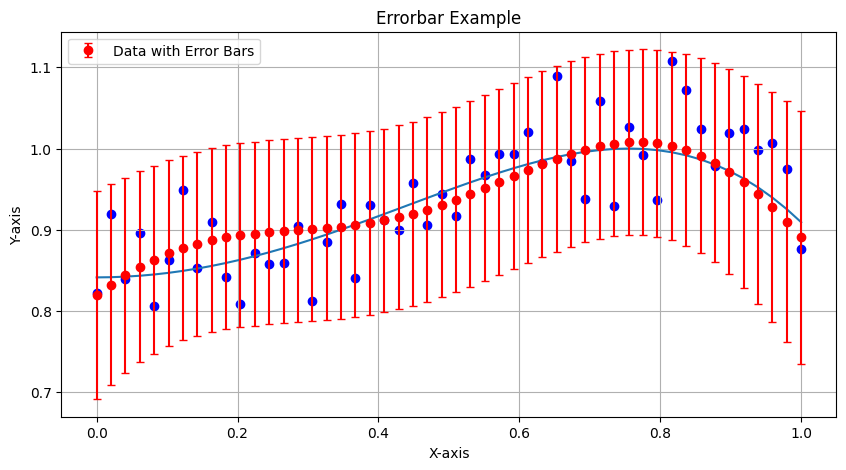

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5]


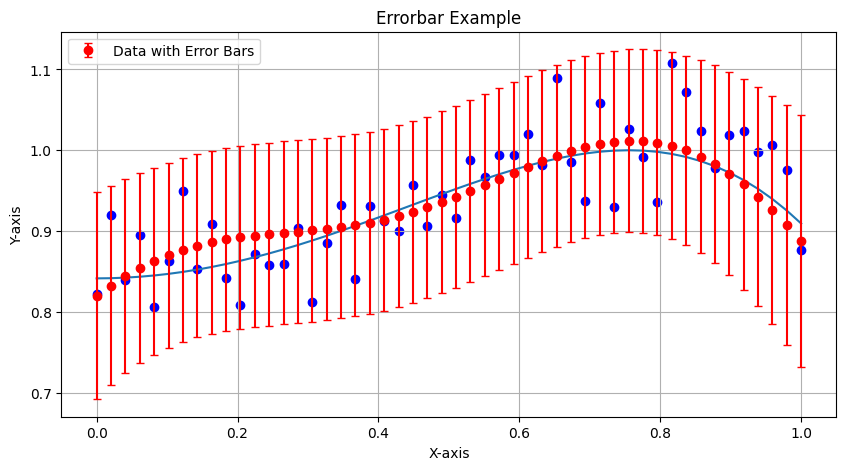

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30]


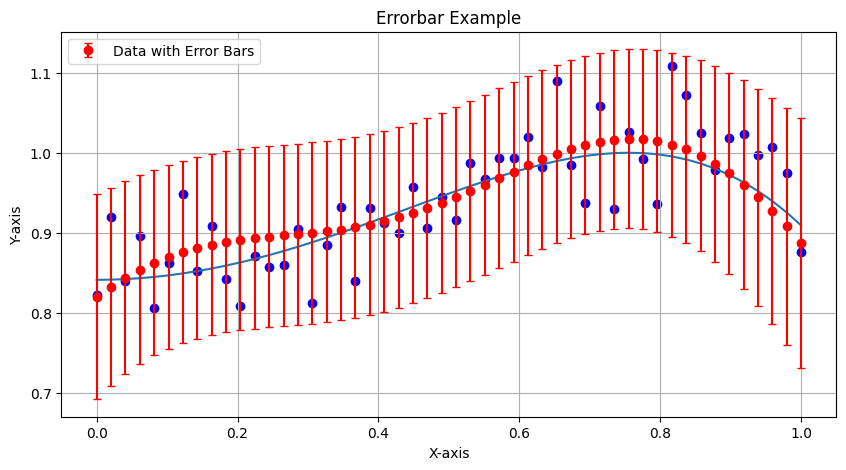

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35]


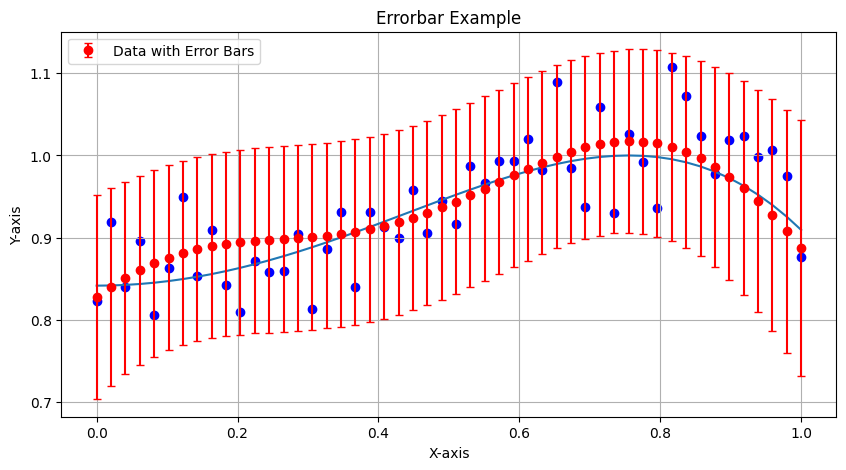

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3]


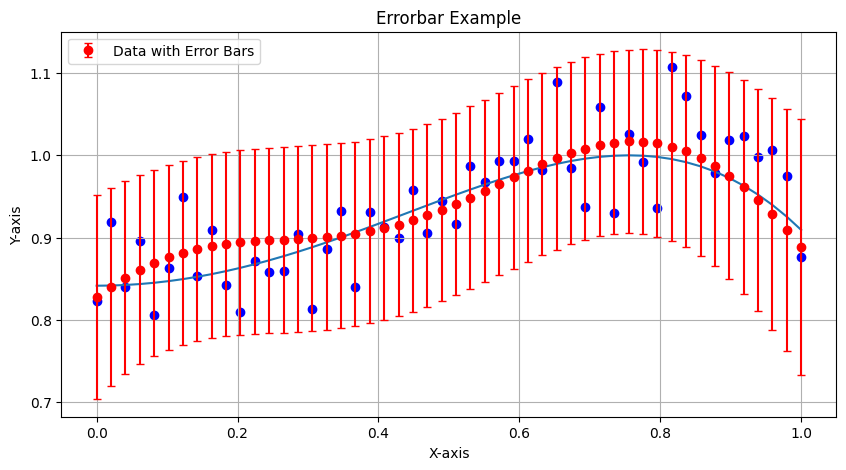

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25]


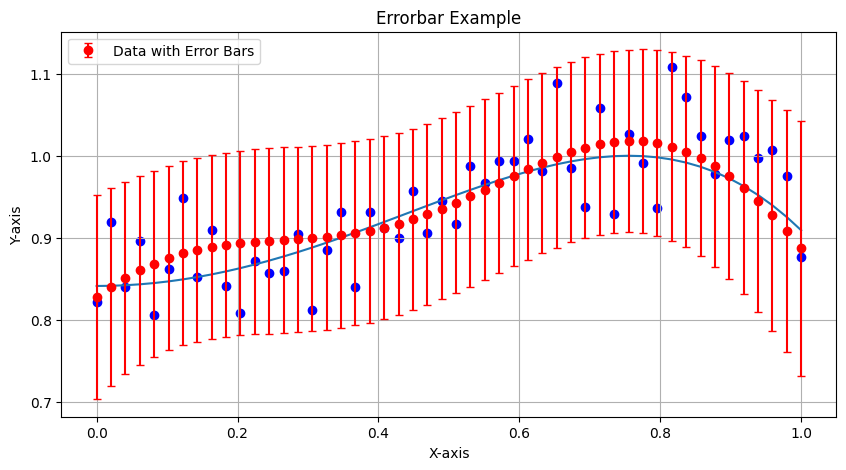

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29]


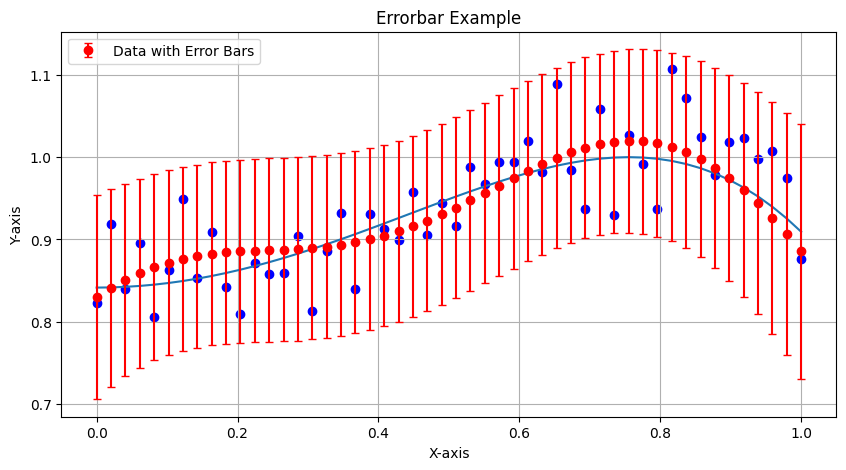

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15]


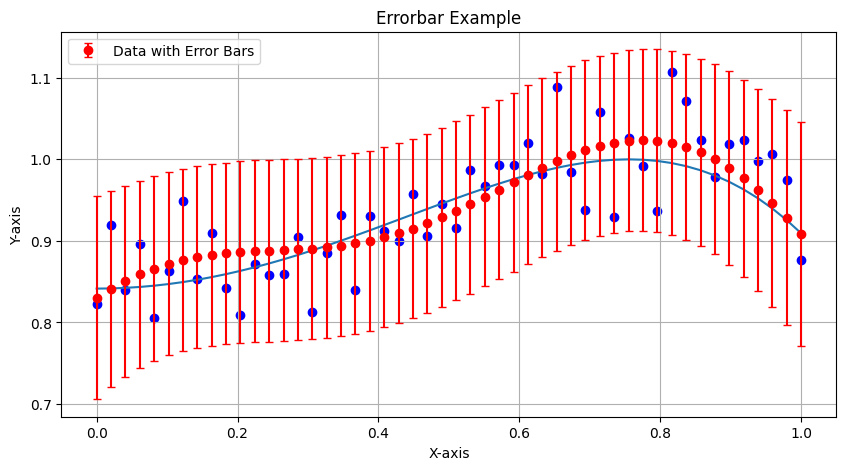

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48]


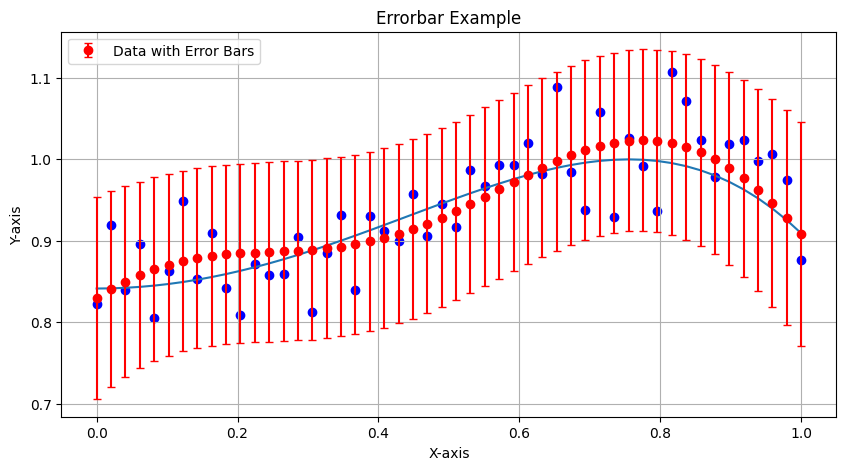

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11]


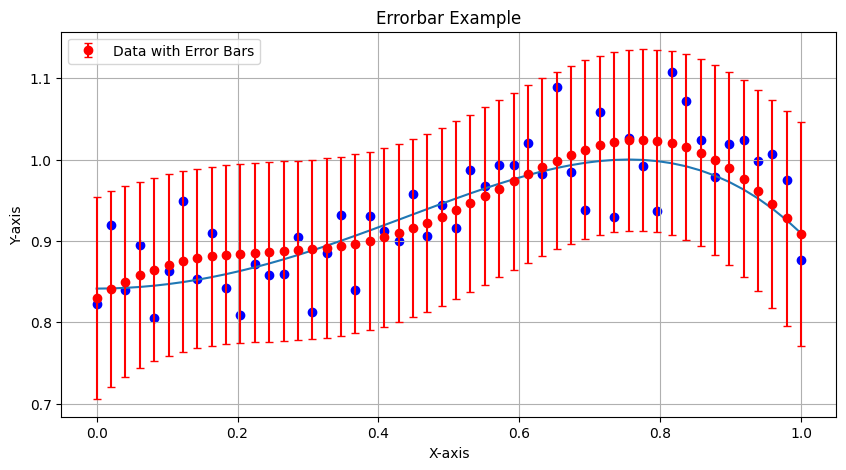

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27]


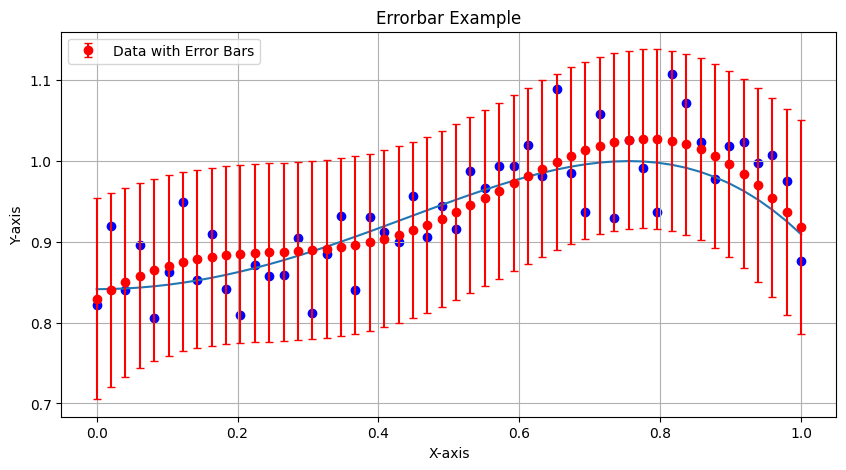

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45]


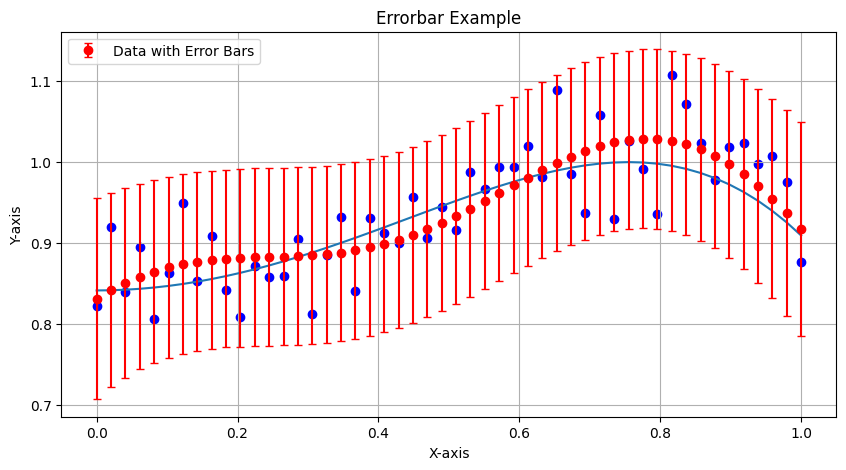

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18]


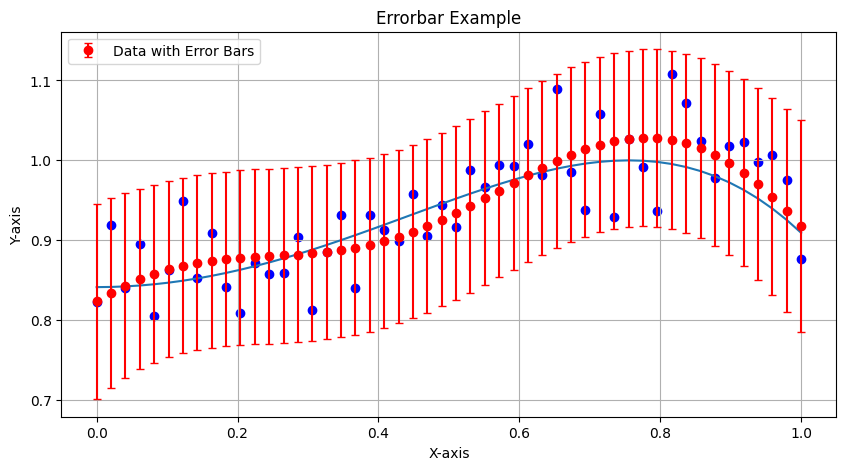

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4]


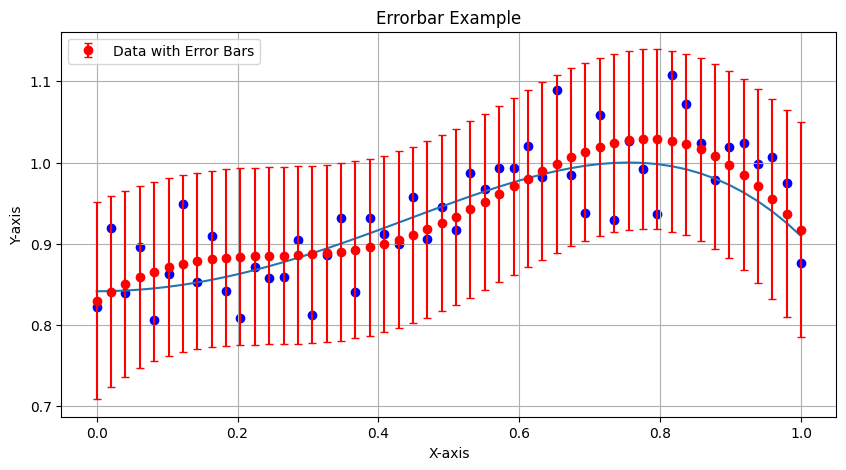

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6]


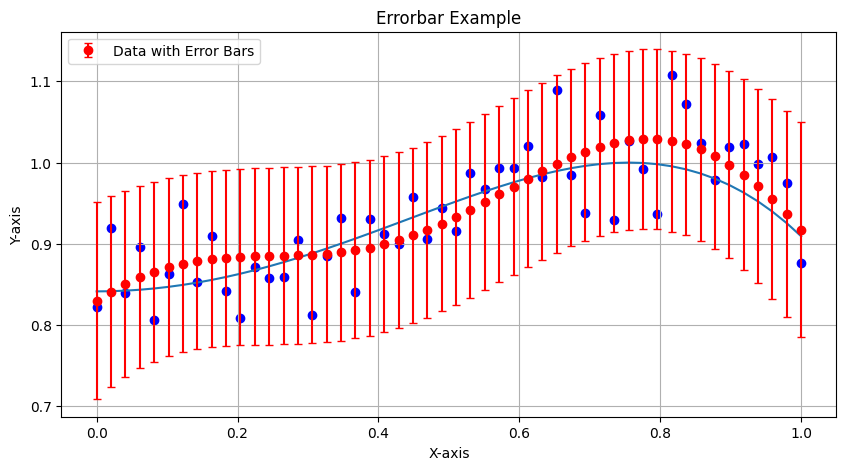

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21]


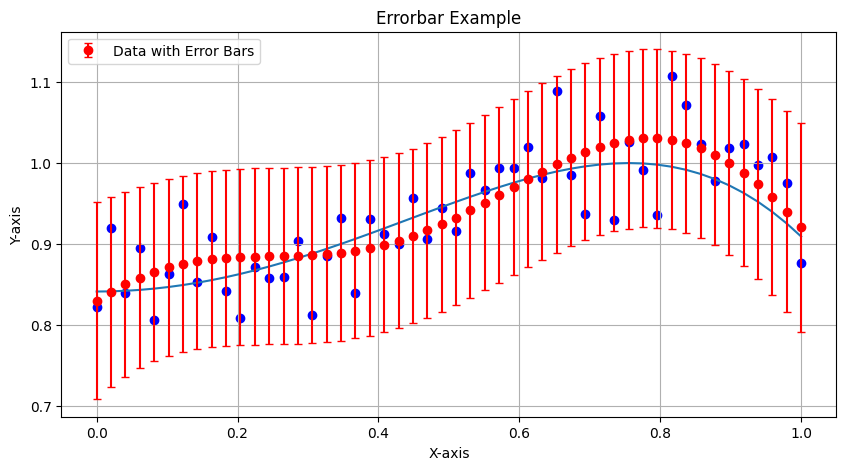

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44]


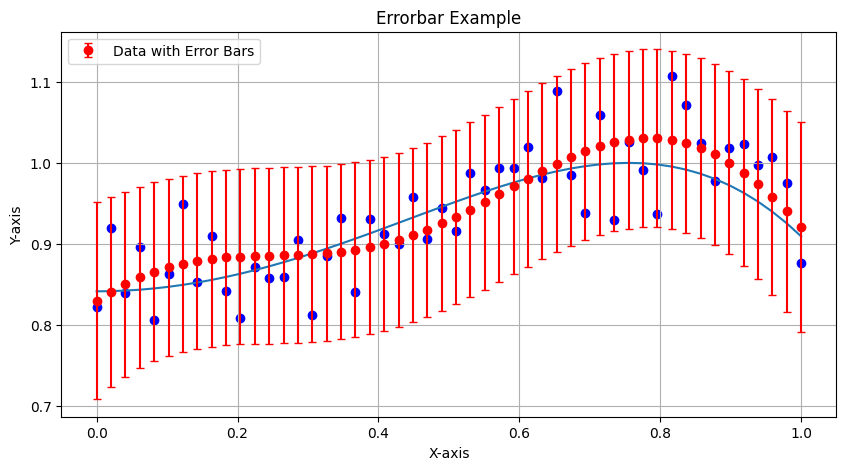

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20]


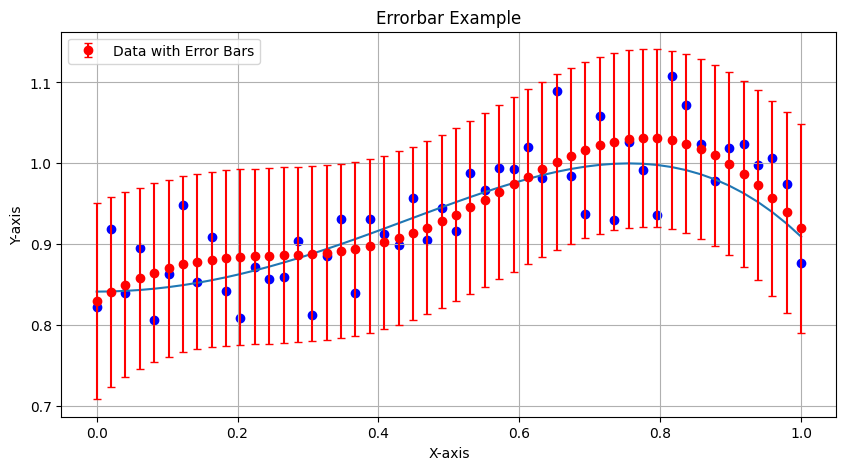

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26]


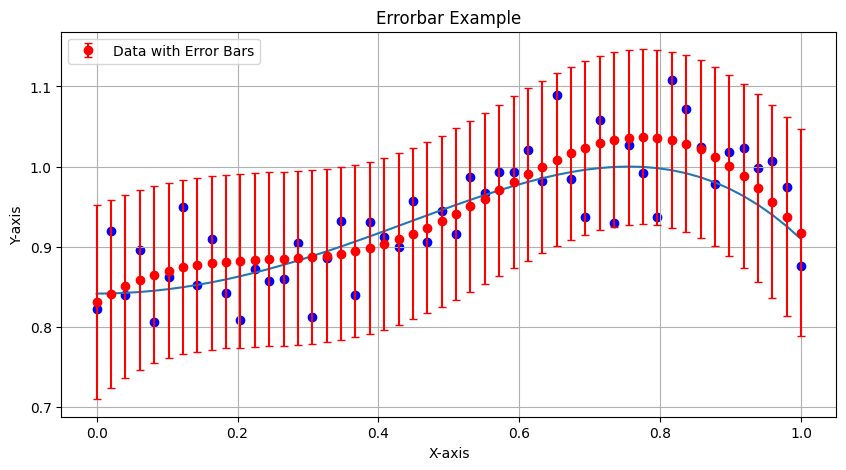

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32]


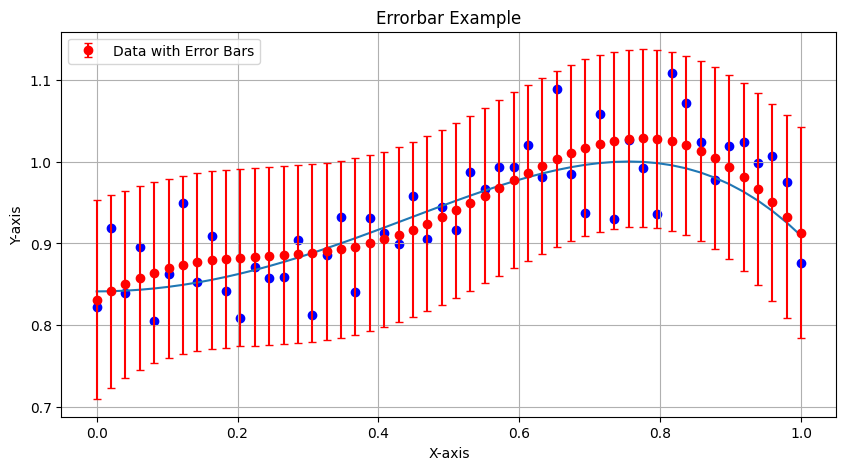

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32 39]


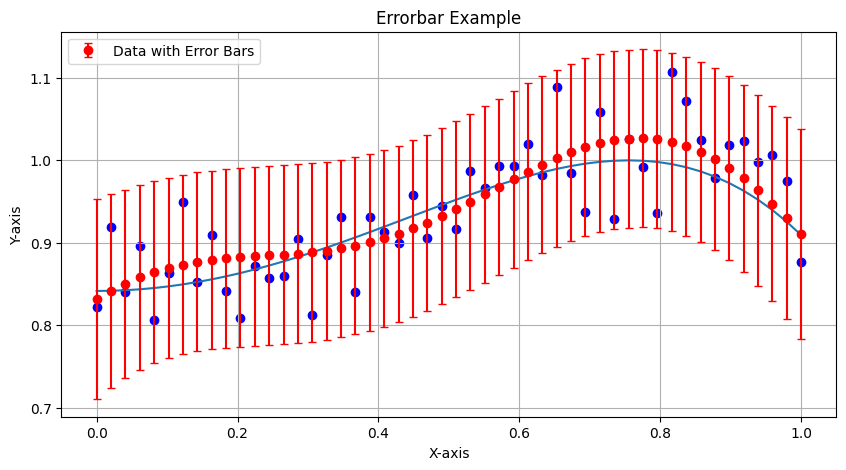

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32 39 43]


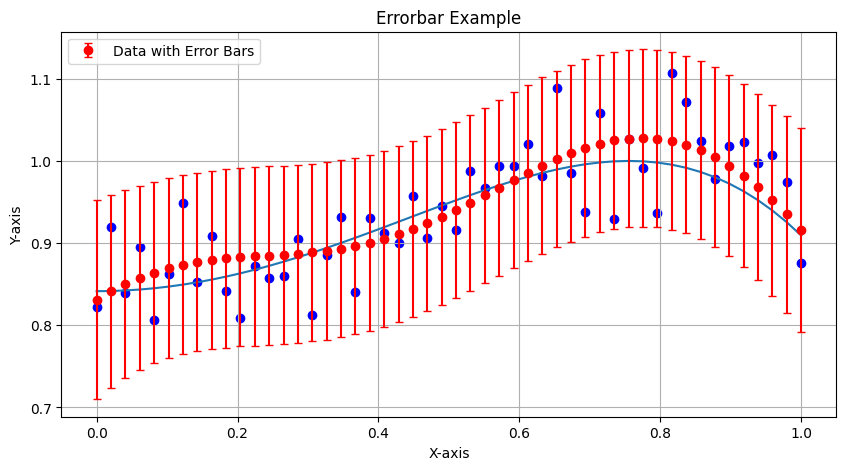

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32 39 43 46]


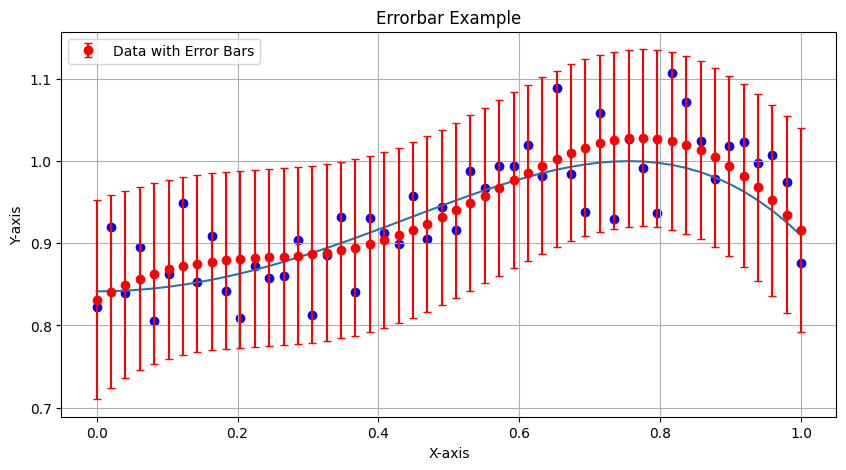

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32 39 43 46 12]


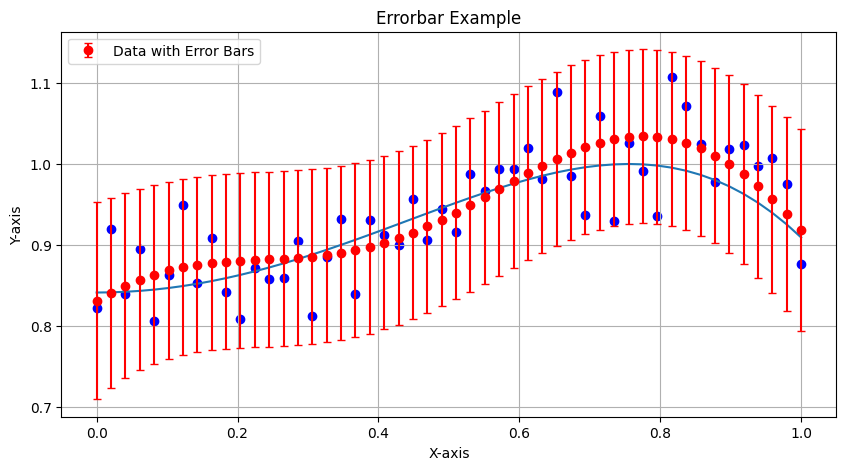

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32 39 43 46 12 40]


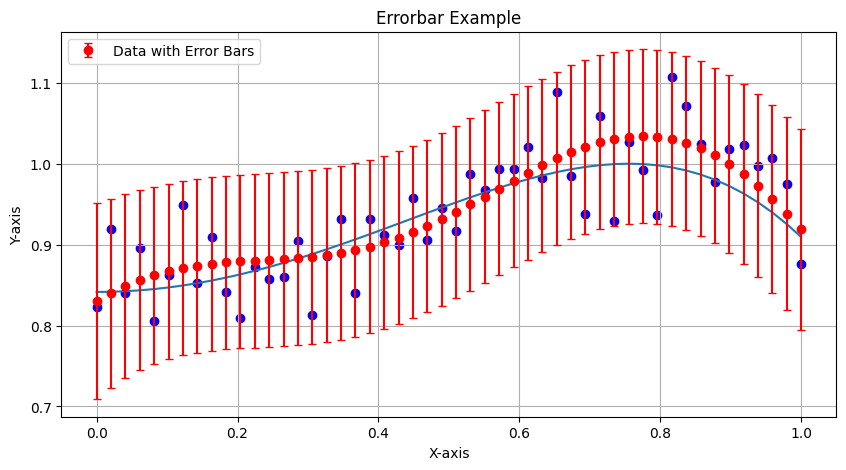

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32 39 43 46 12 40  7]


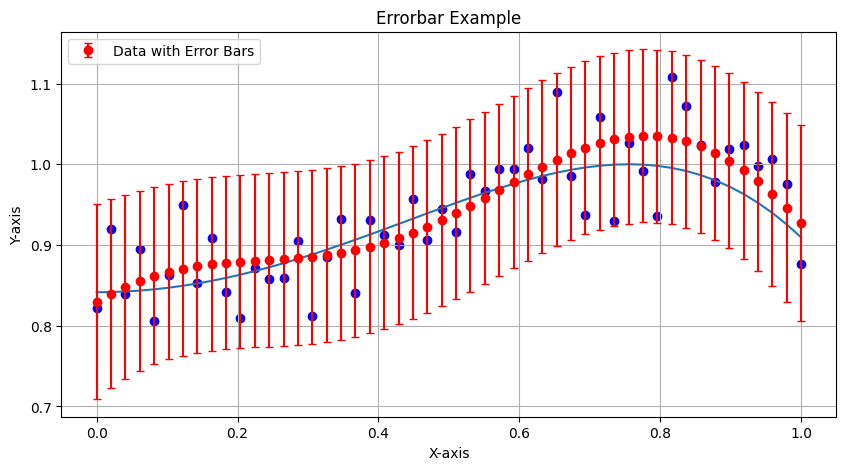

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32 39 43 46 12 40  7 47]


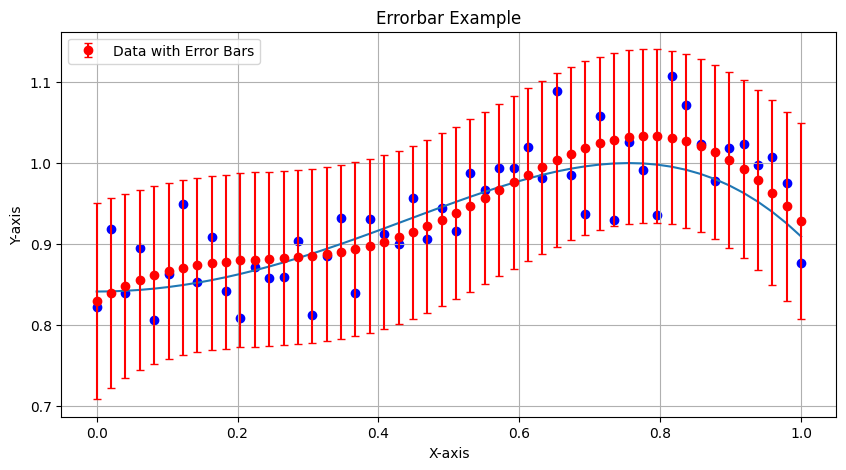

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32 39 43 46 12 40  7 47
 33]


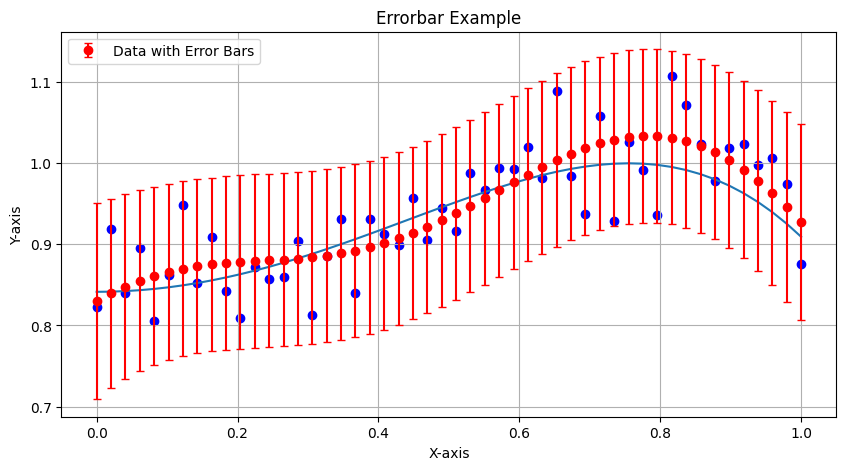

[31 19 23  0 36 37  1 41 28 22  8 49 10 24  9 16 17 14  2 34 38 42  5 30
 35  3 25 29 15 48 11 27 45 18  4  6 21 44 20 26 32 39 43 46 12 40  7 47
 33 13]


In [37]:
#in order to show easily, I used the random sequence as show in CA1 material.
# 生成1到50的随机排列
label = np.random.permutation(50)  # 加1将范围调整为1到50

#choose α=1，β=10.
a = 1
b = 10
M = 20
S = 0.3
S0 = (1/a) * np.identity(M)
m_0 = np.zeros((M, 1))
m_pri = m_0
m_cur = m_0
S_pri = S0
S_cur = S0
##### Gaussian Basis函数
def gaussian_basis(x, mu, a):
    return np.exp(-(x - mu)**2 / (2 * S**2))

def generate_gaussian_Phim(x, M, S):
    mus = np.linspace(0, 1, M-1)
    matrix = np.array([gaussian_basis(x, mu, S) for mu in mus]).T
    matrix = matrix.squeeze()
    matrix = np.insert(matrix, 0, 1, axis=1)
    return matrix
    
Phi = generate_gaussian_Phim(x, M, S)

for i in range(50):
    S_cur = np.linalg.inv(np.linalg.inv(S_pri) + b * Phi[label[i]].reshape(-1,1) @ Phi[label[i]].reshape(1,-1))
    m_cur = S_cur @ (np.linalg.inv(S_pri) @ m_pri + b * Phi[label[i]].reshape(-1,1) * y_noised[label[i]])
    S_pri = S_cur
    m_pri = m_cur
    t_pre = m_pri.T @ Phi.T
    sigma2 = (np.diagonal(1/b + Phi @ S_cur @ Phi.T)).reshape(-1,1)
    x = x.reshape(-1,1)
    plt.figure(figsize=(10, 5))
    plt.scatter(x, y_noised,color='blue')
    plt.plot(x, y)
    plt.errorbar(x.squeeze(), t_pre.squeeze(), sigma2.squeeze(), fmt='o', color='r', ecolor='r', capsize=3, label='Data with Error Bars')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.legend()
    plt.title('Errorbar Example')
    plt.grid(True)
    plt.show()
    print(label[:i+1])


PREDICTIVE DISTRIBUTION shows the process of machine learning from each new data point and provides a recursive relationship. This helps relieve memory pressure when both M and N are large, and for already trained models, we can more easily fine-tune the model instead of recalculating the entire model.

## Part 4: CLASSIFICATION
1. This is  an example code to generate classification data of two class

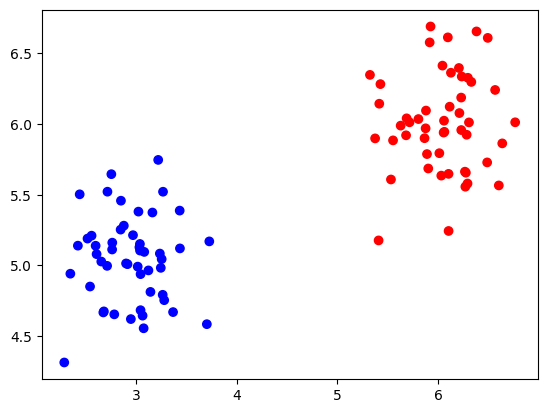

In [86]:
import matplotlib.pyplot as plt
import numpy as np

N1 = 50  # 100 or 50
N2 = 50
K = 2
sigma = 0.1

mean1 = (6, 6)
cov1 = [[sigma, 0], [0, sigma]]
X1 = np.random.multivariate_normal(mean1, cov1, N1)
c1 = ['red'] * len(X1)

mean2 = (3, 5)
cov2 = [[sigma, 0], [0, sigma]]
X2 = np.random.multivariate_normal(mean2, cov2, N2)
c2 = ['blue'] * len(X2)

#outlier:
mean3 = (8, 6)
cov3 = [[sigma, 0], [0, sigma]]
X3 = np.random.multivariate_normal(mean3, cov3, int(np.floor(N2)))
c3 = ['blue'] * len(X3)

##
##

X = np.concatenate((X1,X2))
color = np.concatenate((c1,c2))

T = []
for n in range(0, len(X)):
    if(n<len(X1)):
        T.append(0)
    if(n>=len(X1) and n<len(X1)+len(X2)):
        T.append(1)

plt.scatter(X[:, 0], X[:, 1], marker='o', c=color)

plt.show()

Phi =  (100, 5)
w =  (5, 1)
S =  (5, 5)
o (100,)
RR (100, 100)
[[ 0.47737536]
 [ 0.98762278]
 [ 3.06700221]
 [-3.67481165]
 [-1.07139781]]


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_69476\3536528275.py:43: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  o[j] = sigmoid(w_pri.T @ ((Phi[j].T).reshape(-1,1)))


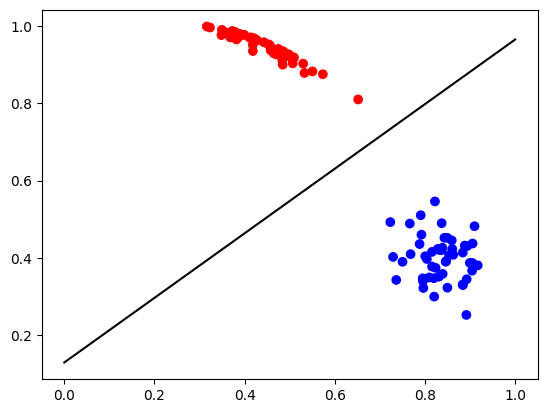

In [180]:
M = 5
S = 3
a = 1
N = 100 # 迭代次数
t = np.concatenate((np.zeros(N1), np.ones(N2)))\

def gaussian_basis(x, mu, a):
    return np.exp(-np.linalg.norm(x - mu, ord=2)**2 / (2 * a**2))

def generate_gaussian_Phim(X, M, S):
    mus = np.linspace(0, 10, M-1)
    Phi = np.zeros((len(X), M-1))

    for i, x in enumerate(X):
        for j, mu in enumerate(mus):
            Phi[i, j] = gaussian_basis(x, mu, S)

    # 添加一个偏置项（常数1）作为第一列
    Phi = np.insert(Phi, 0, 1, axis=1)
    return Phi

#sigmoid funciton
def sigmoid(a):
    return 1/(1+np.exp(-a))

Phi = generate_gaussian_Phim(X, M, S)
print('Phi = ', Phi.shape)

w_cur = np.ones(M).reshape(-1,1)
w_pri = w_cur.copy()
print('w = ', w_cur.shape)

S0_1 = (1/a) * np.identity(M)
print('S = ', S0_1.shape)
o = np.zeros(X.shape[0])
print('o', o.shape)
RR = np.zeros((X.shape[0], X.shape[0]))
print('RR', RR.shape)
m0 = np.zeros((M, 1))

for i in range(N):
    for j in range(X.shape[0]):
        o[j] = sigmoid(w_pri.T @ ((Phi[j].T).reshape(-1,1)))
    for k in range(X.shape[0]):
        RR[k][k] = o[k] * (1 - o[k])   
    w_cur = w_pri - np.linalg.inv(S0_1 + Phi.T @ RR @ Phi) @ (S0_1 @ (w_pri - m0) + (Phi.T @ (o.T - t)).reshape(-1,1))
    w_pri = w_cur

print(w_cur)

plt.scatter(Phi[:, 2], Phi[:, 3], marker='o', c=color)

x = np.linspace(0, 1, 20)  # 范围根据需要调整
y = ( (-w[2]) / w[3]) * x - (w[0] / w[3])
plt.plot(x, y, color='black')

plt.show()


The display of basis 1 and basis 2 are not ideal enough, so I chose basis 2 and basis 3, which are more clear, for display.

(100, 2)
(40000, 2)
(40000, 5)
(40000, 1)
(40000, 1)


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_69476\254459541.py:29: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(XX[:, 0], XX[:, 1], c=colors, cmap='cool', marker='o')


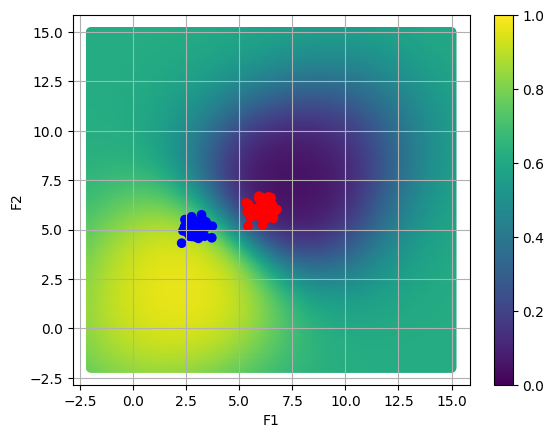

In [207]:
print(X.shape)
# 假设你有一个已知的权重向量 w
w = w_cur  # 请替换为你的实际权重向量

# 创建一个二维网格
x_range = np.linspace(-2, 15, 200)  # 适应你的数据范围
y_range = np.linspace(-2, 15, 200)  # 适应你的数据范围
xx, yy = np.meshgrid(x_range, y_range)

xx = xx.reshape(-1, 1)
yy = yy.reshape(-1, 1)

XX = np.column_stack((xx, yy))
print(XX.shape)

Phi_c = generate_gaussian_Phim(XX, M, S)
print(Phi_c.shape)

aa = Phi_c @ w_cur
print(aa.shape)

PP = sigmoid(aa)
print(PP.shape)

cmap = plt.get_cmap('viridis')  # 选择 'cool' colormap
colors = cmap(PP)

# 绘制散点图，并使用颜色映射上色
plt.scatter(XX[:, 0], XX[:, 1], c=colors, cmap='cool', marker='o')

# 添加颜色条以显示概率值与颜色的映射
colorbar = plt.colorbar()

# 设置图的标签和标题
plt.xlabel('F1')
plt.ylabel('F2')
plt.scatter(X[:, 0], X[:, 1], marker='o', c=color)
plt.grid(True)
plt.show()





